In [43]:
import sys

%load_ext autoreload

%autoreload 2

import river.cluster as rcluster
from sklearn.preprocessing import MinMaxScaler
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.patches as ptc
from clustpy.partition import XMeans
from sklearn.cluster import KMeans, HDBSCAN
from dbhd_clustering.DBHDALGO import DBHD
from clustpy.metrics import unsupervised_clustering_accuracy, PairCountingScores
from river import metrics as rmetrics
import warnings
warnings.simplefilter(action='ignore', category=FutureWarning)

from evaluate import printMetrics 
from datahandler import load_data

from scipy.spatial import Voronoi, voronoi_plot_2d

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


(3031, 2)
3031


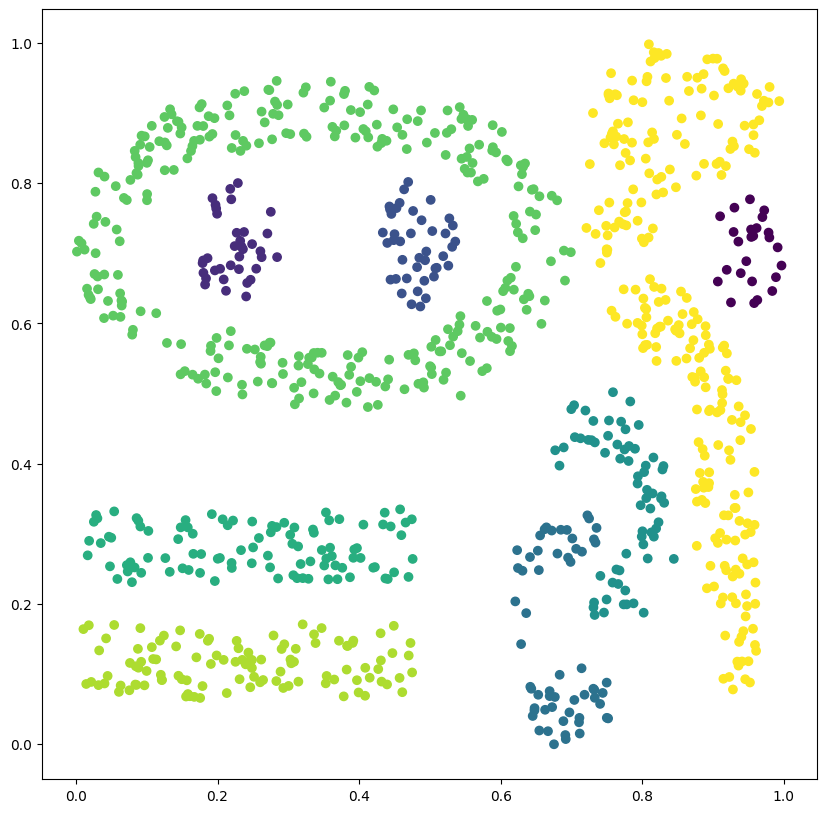

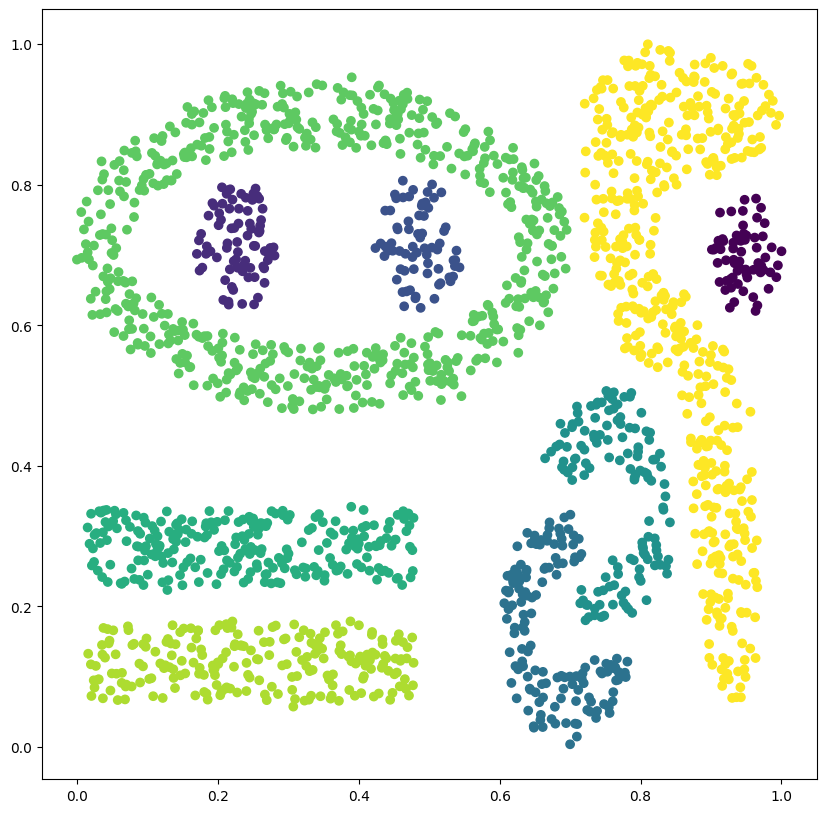

In [44]:
X, y = load_data("complex9", "artificial", 2)
print(X.shape)
print(len(y))
c = 1000
X_test = X[c:]
y_test = y[c:]
X = X[:c]
y = y[:c]
plt.figure(figsize=(10,10))
plt.scatter(X[:, 0], X[:, 1], c=y)
plt.show()
plt.figure(figsize=(10,10))
plt.scatter(X_test[:, 0], X_test[:, 1], c=y_test)
plt.show()

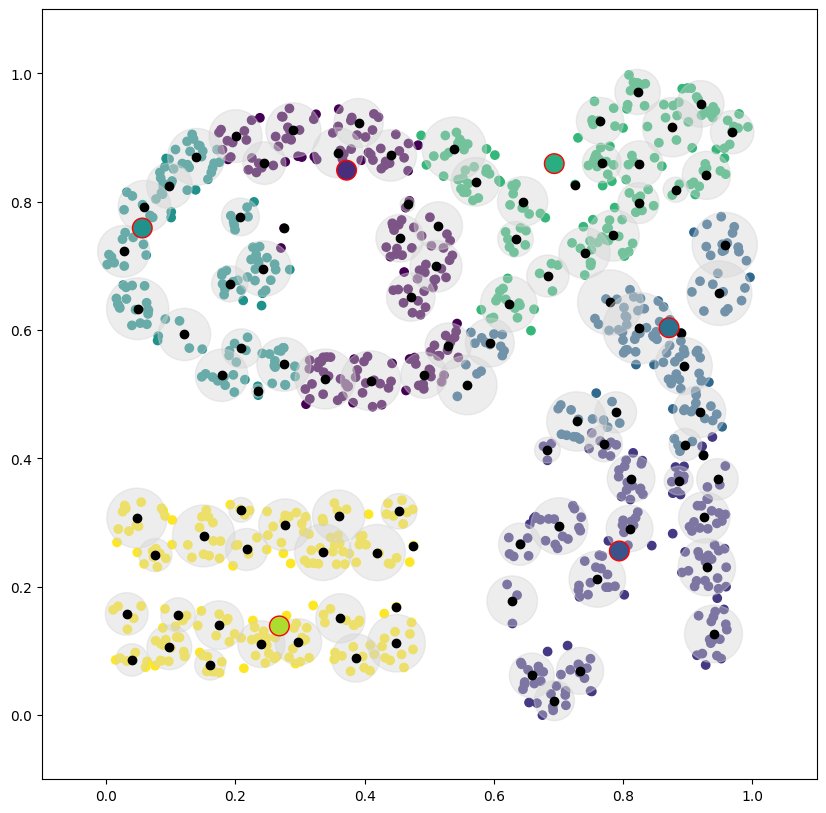

    0   1     2    3    4     5     6   7     8  
0   0     0    0   25     0     0   0     0   0  
1   0     2    0    0    34     0   0     0   0  
2   0    41    0    0     0     0   0     0   0  
3   0     0   59    0     0     0   0     0   0  
4   0     0   51   15     0     0   0     0   0  
5   0     0    0    0     0     0   0   100   0  
6   0   122    0   14   105    66   0     0   0  
7   0     0    0    0     0     0   0   108   0  
8   0     0   67   77     0   114   0     0   0  
Acc: 0.462 NMI: 0.5970311699077122 ARI: 0.34699267438474357 AMI: 0.5924438295153043 Pur.: 0.593 Prec.: 0.49682969946965233 Rec.: 0.4370399552136681 F1: 0.4650208485008935 Comp.: 0.612517502900259 Fowl.: 0.46597685522463134 Homo.: 0.5823086109428035 Clu.Num.: 6 True Clu.Num 9


In [45]:
from utils import dict_to_np, dps_to_np
from competitors.clustream import CluStream
clustream = CluStream(n_macro_clusters=9, max_micro_clusters=100, sigma=0.5, mu=0.5, seed=0, time_gap=10000)
for x in X:
	dp = dict(enumerate(x))
	clustream.learn_one(dp)
clustream_labels_train = []
for x in X:
	dp = dict(enumerate(x))
	pred = clustream.predict_one(dp, recluster=True)
	clustream_labels_train.append(pred)

#vor = Voronoi(dps_to_np(clustream.centers.values()))
clustream_centers = dps_to_np(clustream.centers.values())
plt.figure(figsize=(10, 10))
#voronoi_plot_2d(vor, show_vertices=False, show_points=False)
plt.scatter(X[:, 0], X[:, 1], c=clustream_labels_train)
for id, mc in clustream.micro_clusters.items():
    mccenter = dict_to_np(mc.center)
    mc_patch = ptc.Circle((float(mccenter[0]), float(mccenter[1])), mc.radius(2), alpha=0.4, color="lightgrey")
    plt.gca().add_patch(mc_patch)
    plt.scatter(float(mccenter[0]), float(mccenter[1]), c="black")
plt.scatter(clustream_centers[:, 0], clustream_centers[:,1], c=clustream.centers.keys(), s= 200, edgecolors='red')
plt.ylim(-0.1, 1.1)
plt.xlim(-0.1, 1.1)
plt.show()
       
print(printMetrics(y, clustream_labels_train))

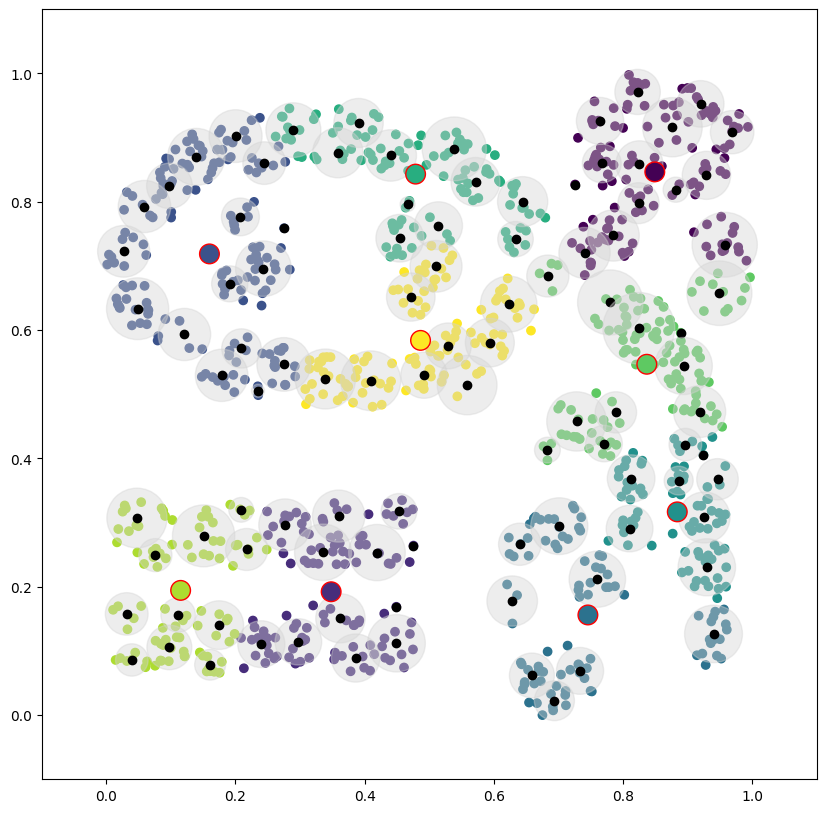

    0     1    2     3    4    5    6    7    8   
0    14    0     0    0    0    0   11    0    0  
1     0    0    36    0    0    0    0    0    0  
2     0    0     0    0    0   18    0    0   23  
3     0    0     0   59    0    0    0    0    0  
4     0    0     0   15   25    0   26    0    0  
5     0   54     0    0    0    0    0   46    0  
6     0    0   124    0    0   91    4    0   88  
7     0   60     0    0    0    0    0   48    0  
8   114    0     0   16   55    0   73    0    0  
Acc: 0.465 NMI: 0.6191406040517221 ARI: 0.36715672415063677 AMI: 0.6127440897855855 Pur.: 0.712 Prec.: 0.6150514347590688 Rec.: 0.36509154243297604 F1: 0.45819861431870673 Comp.: 0.5756276929921633 Fowl.: 0.47386715120569745 Homo.: 0.6697699249279763 Clu.Num.: 9 True Clu.Num 9


In [46]:
from competitors.clustream import CluStream
clustream2 = CluStream(n_macro_clusters=9, max_micro_clusters=100, sigma=0.5, mu=0.5, seed=0, time_gap=10000)
for x in X:
	dp = dict(enumerate(x))
	clustream2.learn_one(dp)
clustream2_labels_train = []
for x in X:
	dp = dict(enumerate(x))
	pred = clustream2.predict_one(dp, recluster=True, sklearn=True)
	clustream2_labels_train.append(pred)
    
clustream_centers = clustream2._kmeans.cluster_centers_
plt.figure(figsize=(10, 10))
plt.scatter(X[:, 0], X[:, 1], c=clustream2_labels_train)
for id, mc in clustream2.micro_clusters.items():
    mccenter = dict_to_np(mc.center)
    mc_patch = ptc.Circle((float(mccenter[0]), float(mccenter[1])), mc.radius(2), alpha=0.4, color="lightgrey")
    plt.gca().add_patch(mc_patch)
    plt.scatter(float(mccenter[0]), float(mccenter[1]), c="black")
plt.scatter(clustream_centers[:, 0], clustream_centers[:,1], c=range(len(clustream_centers)), s= 200, edgecolors='red')

plt.ylim(-0.1, 1.1)
plt.xlim(-0.1, 1.1)
plt.show()
       
print(printMetrics(y, clustream2_labels_train))

merged 54 7 0.0082921665722533 73
merged 52 13 0.008742965049259692 71
merged 70 27 0.009549625914690376 69
merged 18 8 0.009892941706981089 67
merged 58 53 0.017675870900681907 65
merged 36 14 0.019031481532466116 63
merged 72 34 0.01928278736329827 61
merged 41 3 0.02010426836175082 59
merged 22 19 0.021788595796366817 57
merged 59 18 0.02271729511929364 56
merged 23 15 0.023192223825950212 54
merged 44 10 0.026465593392901086 52
merged 51 36 0.028694504406205138 51
merged 50 49 0.02978878559245288 49
I was here {0: 0.6033972235903395, 1: 0.6458032305433187}: 61, 0, 0.014557246223401986
merged 71 61 0.02118140357720046 49
I was here {0: 0.0303137101079125, 1: 0.322079295154185}: 60, 29, 0.012818730495245897
merged 74 70 0.03265752619550303 50
I was here {0: 0.3600116199851948, 1: 0.9443242290748899}: 59, 73, 0.012829059890606008
merged 73 59 0.01282905989060605 49
I was here {0: 0.9722771926823585, 1: 0.7610126284875184}: 58, 56, 0.07648616911996317
merged 58 54 0.01701661098704385 5

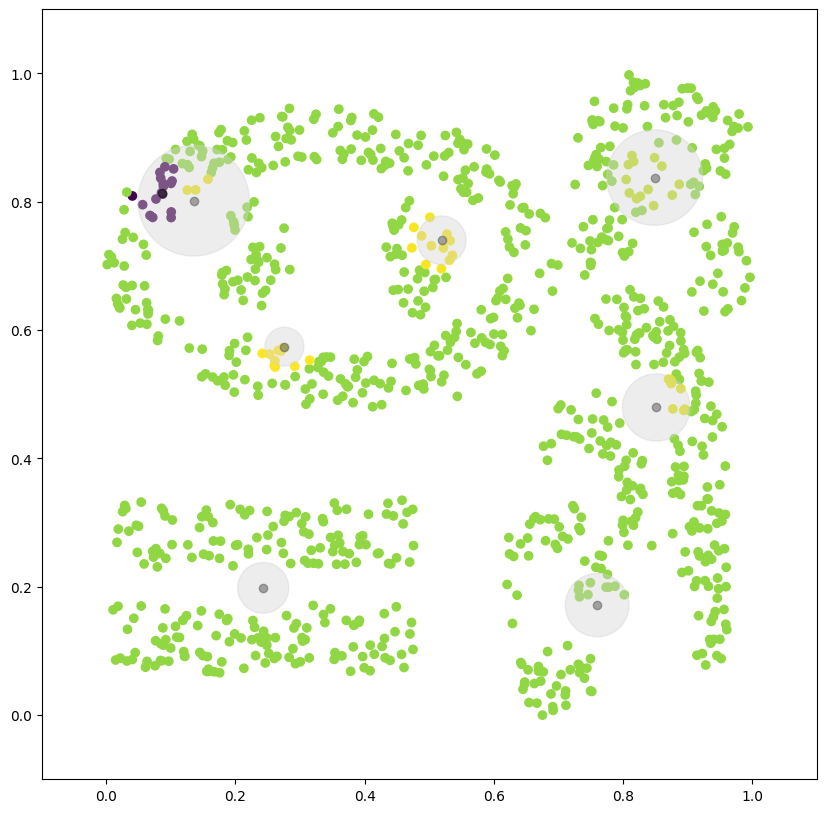

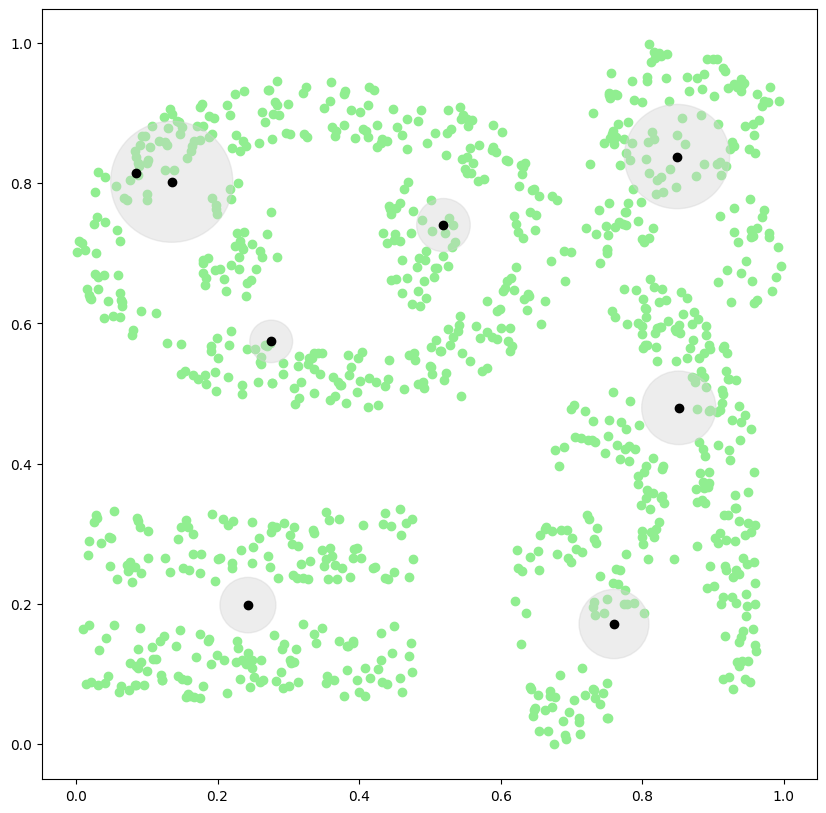

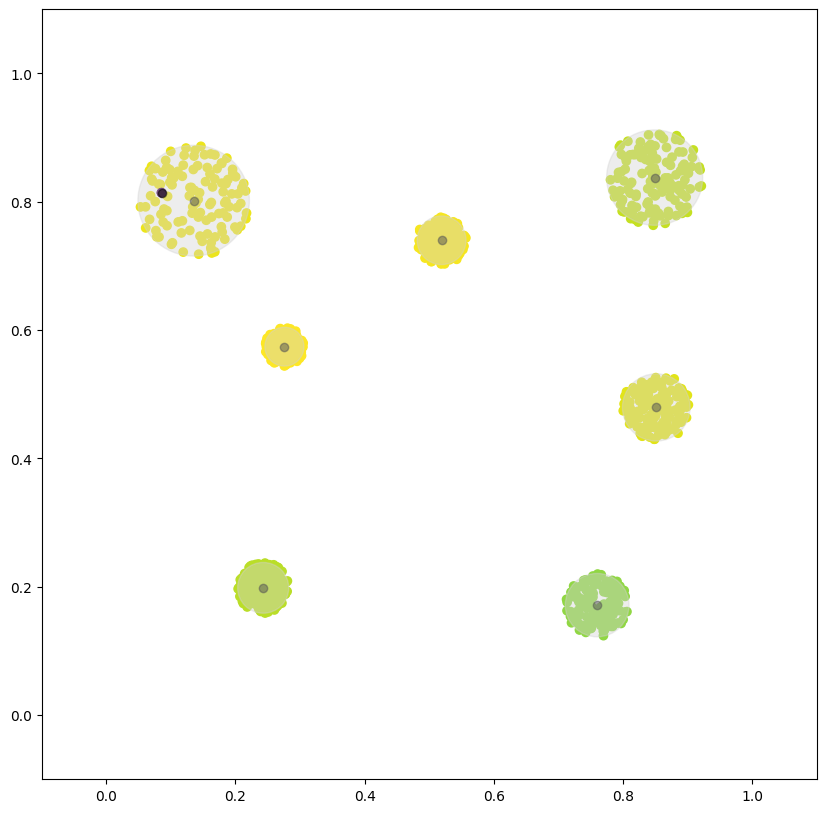

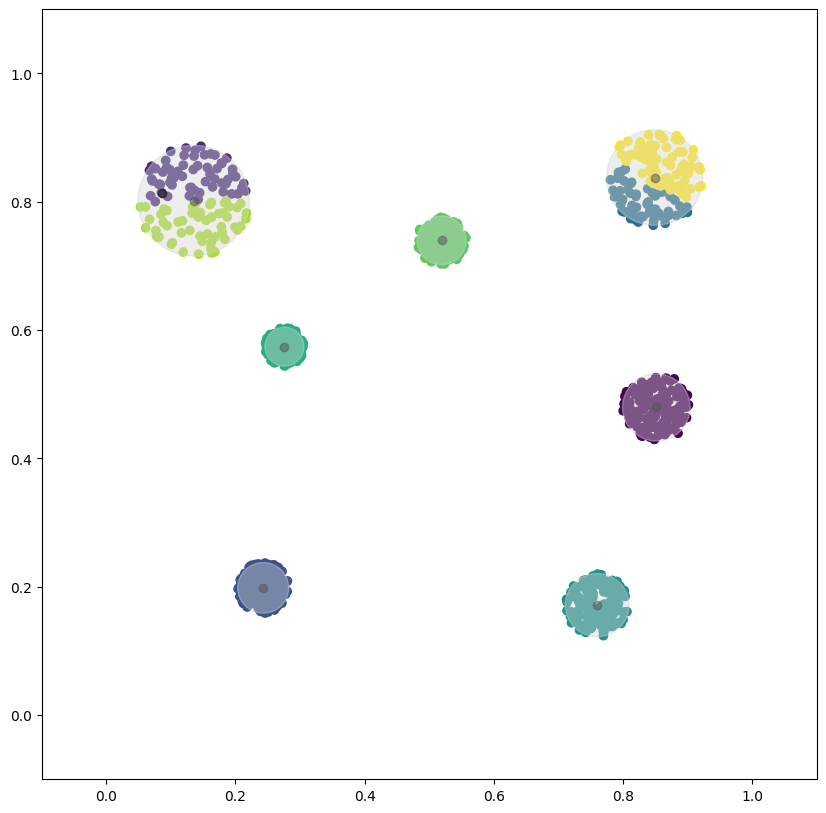

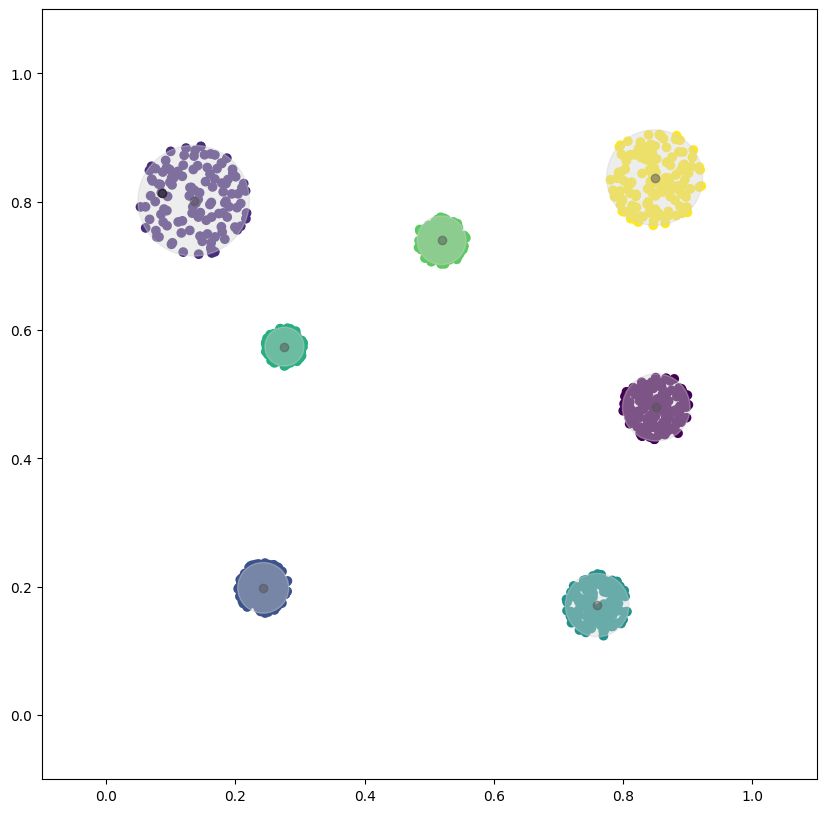

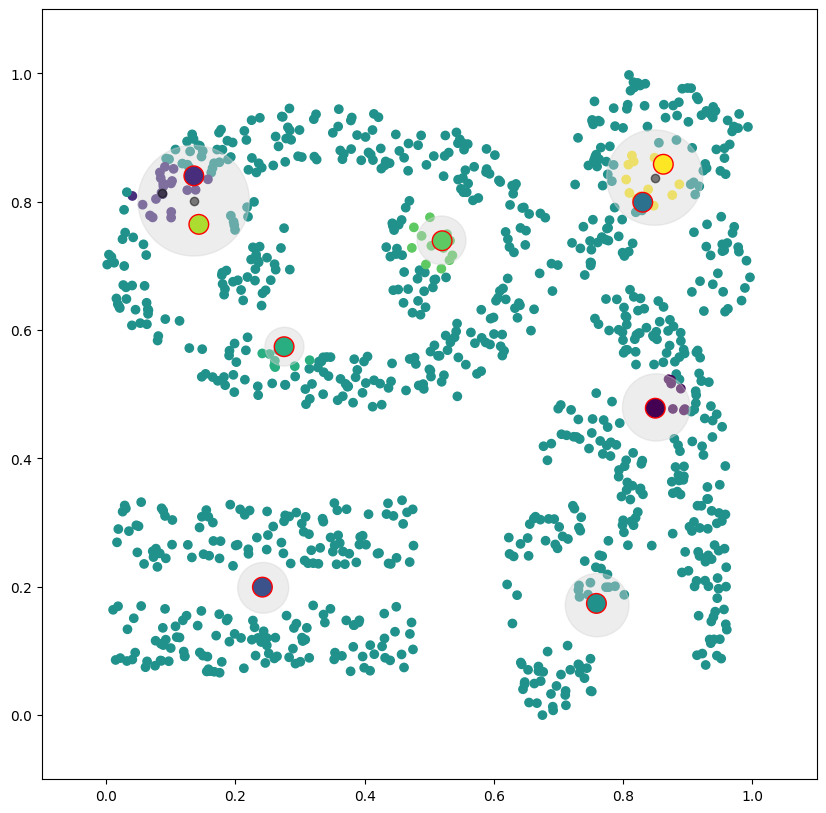

    0   1    2   3   4     5    6    7   8   
0   0    0   0   0    25    0    0   0    0  
1   0    0   0   0    36    0    0   0    0  
2   0    0   0   0    29    0   12   0    0  
3   0    0   0   0    59    0    0   0    0  
4   0    0   0   0    66    0    0   0    0  
5   0    0   0   0   100    0    0   0    0  
6   0   20   0   0   276   11    0   0    0  
7   0    0   0   0   108    0    0   0    0  
8   7    0   0   0   238    0    0   0   13  
Acc: 0.301 NMI: 0.09467613302257404 ARI: -0.012450617743587735 AMI: 0.0768024423803054 Pur.: 0.339 Prec.: 0.18792005941776063 Rec.: 0.8551182898256235 F1: 0.3081265035936823 Comp.: 0.31337769341260324 Fowl.: 0.4008664114555434 Homo.: 0.055761219735217527 Clu.Num.: 6 True Clu.Num 9


In [47]:
from method.offlineHandler import SCOPEOffline

scope = SCOPEOffline(n_macro_clusters=9, max_micro_clusters=75, sigma=0.5, mu=0.5, seed=0, time_gap=10000, offline_datascale=1000)
for x in X:
	dp = dict(enumerate(x))
	scope.learn_one(dp)
    
scope.display_store()

plt.figure(figsize=(10, 10))
plt.scatter(X[:, 0], X[:, 1], c="lightgreen")
for id, mc in scope.micro_clusters.items():
    mccenter = dict_to_np(mc.center)
    mc_patch = ptc.Circle((float(mccenter[0]), float(mccenter[1])), mc.radius(1), alpha=0.4, color="lightgrey")
    plt.gca().add_patch(mc_patch)
    plt.scatter(float(mccenter[0]), float(mccenter[1]), c="black", alpha= 1)

scope_labels_train = []

for x in X:
	dp = dict(enumerate(x))
	pred = scope.predict_one(dp)
	scope_labels_train.append(pred)

scope_centers = scope.centers
plt.figure(figsize=(10, 10))
plt.scatter(X[:, 0], X[:, 1], c=scope_labels_train)
for id, mc in scope.micro_clusters.items():
    mccenter = dict_to_np(mc.center)
    mc_patch = ptc.Circle((float(mccenter[0]), float(mccenter[1])), mc.radius(1), alpha=0.4, color="lightgrey")
    plt.gca().add_patch(mc_patch)
    plt.scatter(float(mccenter[0]), float(mccenter[1]), c="black", alpha= 0.5)
plt.scatter(scope_centers[:, 0], scope_centers[:,1], c=range(len(scope_centers)), s= 200, edgecolors='red')

plt.ylim(-0.1, 1.1)
plt.xlim(-0.1, 1.1)
plt.show()
    
print(printMetrics(y, scope_labels_train))

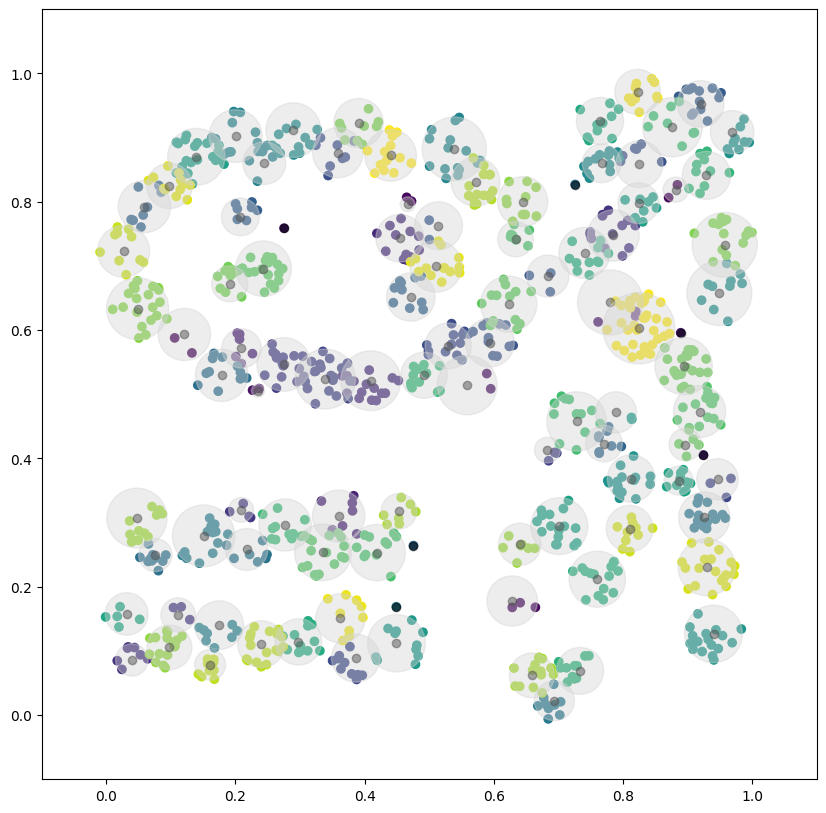

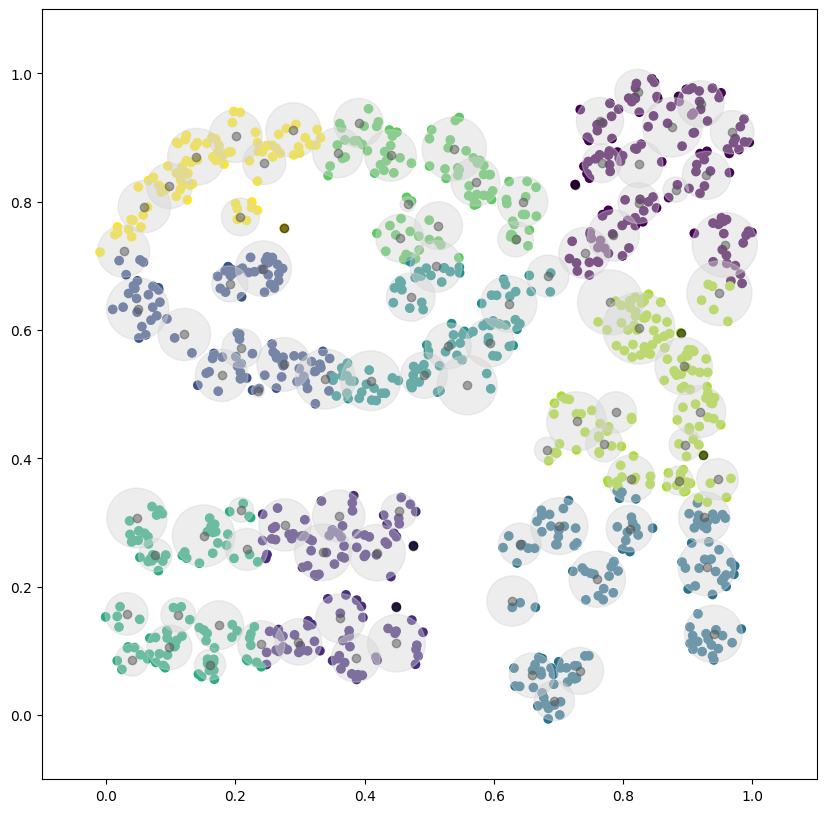

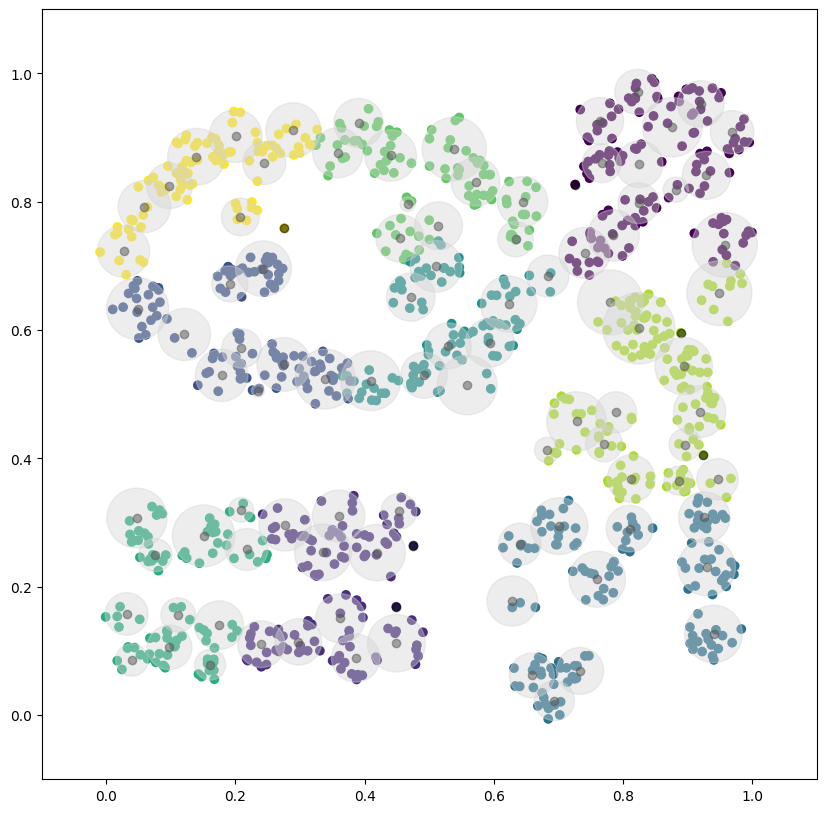

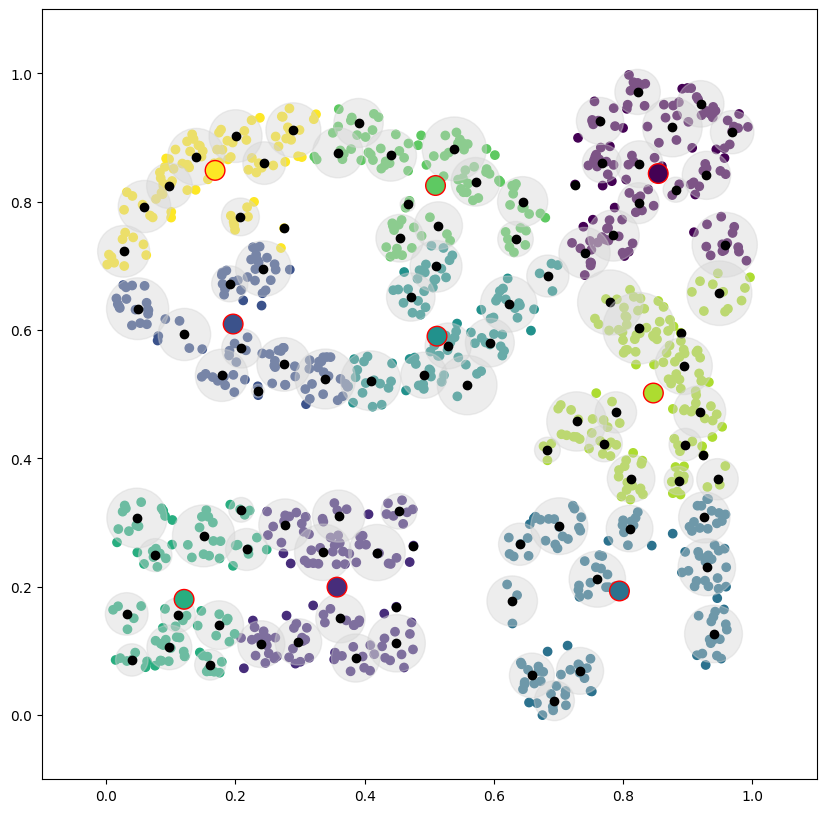

    0     1    2    3    4    5    6    7    8   
0    14    0    0    0    0    0    0   11    0  
1     0    0   27    0    0    0    0    0    9  
2     0    0    0    0   23    0   18    0    0  
3     0    0    0   59    0    0    0    0    0  
4     0    0    0   25    0    0    0   41    0  
5     0   54    0    0    0   46    0    0    0  
6     0    0   74    0   72    0   78    0   83  
7     0   60    0    0    0   48    0    0    0  
8   114    0    0   51    0    0    0   93    0  
Acc: 0.453 NMI: 0.608964678145012 ARI: 0.33286519196335024 AMI: 0.6024087808993162 Pur.: 0.681 Prec.: 0.5784673464347458 Rec.: 0.339951066785544 F1: 0.4282374758397326 Comp.: 0.5655857283221871 Fowl.: 0.44345303192231617 Homo.: 0.6595504792198966 Clu.Num.: 9 True Clu.Num 9


In [48]:

from method.offlineHandler import GenCluStream
genclustream = GenCluStream(n_macro_clusters=9, max_micro_clusters=100, sigma=0.5, mu=0.5, seed=0, time_gap=10000, offline_datascale=1000)
for x in X:
	dp = dict(enumerate(x))
	genclustream.learn_one(dp)
genclustream_labels_train = []
for x in X:
	dp = dict(enumerate(x))
	pred = genclustream.predict_one(dp)
	genclustream_labels_train.append(pred)
    
clustream_centers = genclustream.centers
plt.figure(figsize=(10, 10))
plt.scatter(X[:, 0], X[:, 1], c=genclustream_labels_train)
for id, mc in genclustream.micro_clusters.items():
    mccenter = dict_to_np(mc.center)
    mc_patch = ptc.Circle((float(mccenter[0]), float(mccenter[1])), mc.radius(2), alpha=0.4, color="lightgrey")
    plt.gca().add_patch(mc_patch)
    plt.scatter(float(mccenter[0]), float(mccenter[1]), c="black")
plt.scatter(clustream_centers[:, 0], clustream_centers[:,1], c=range(len(clustream_centers)), s= 200, edgecolors='red')

plt.ylim(-0.1, 1.1)
plt.xlim(-0.1, 1.1)
plt.show()
    
print(printMetrics(y, genclustream_labels_train))

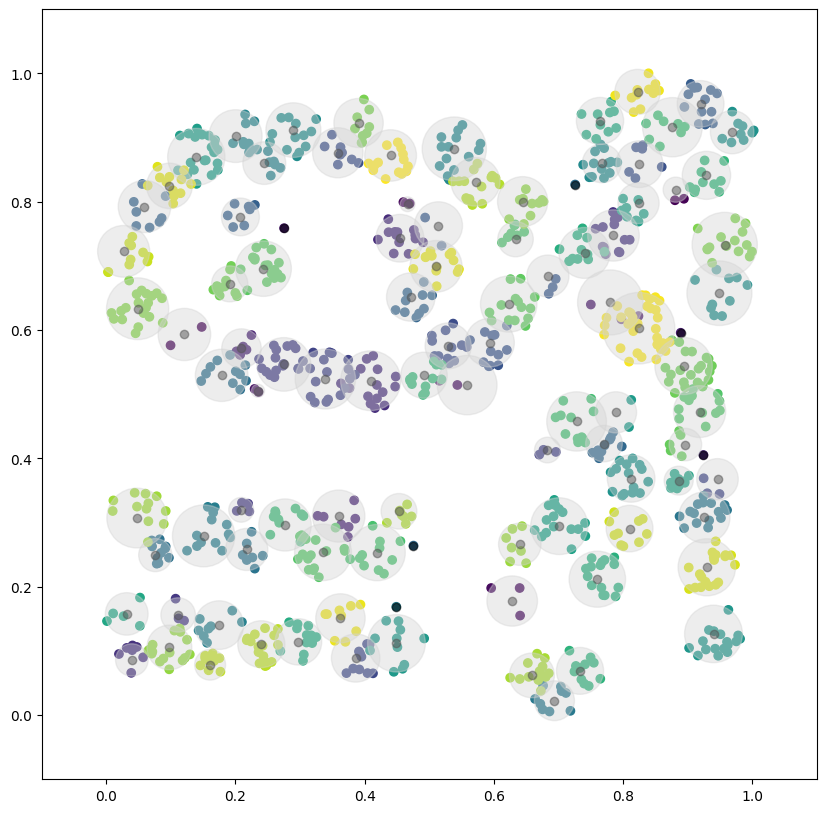

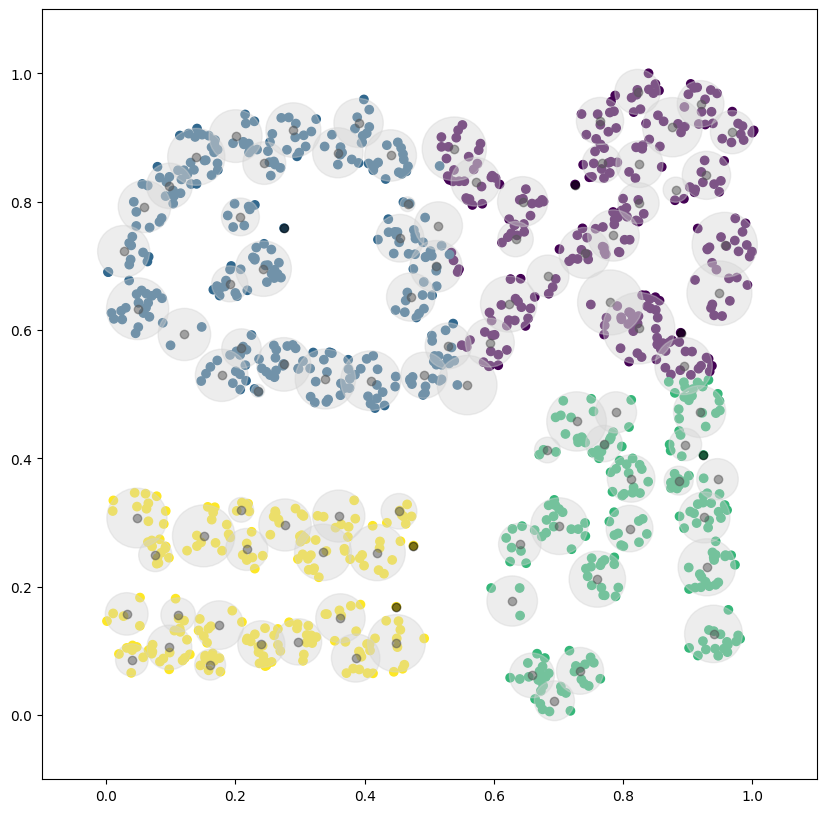

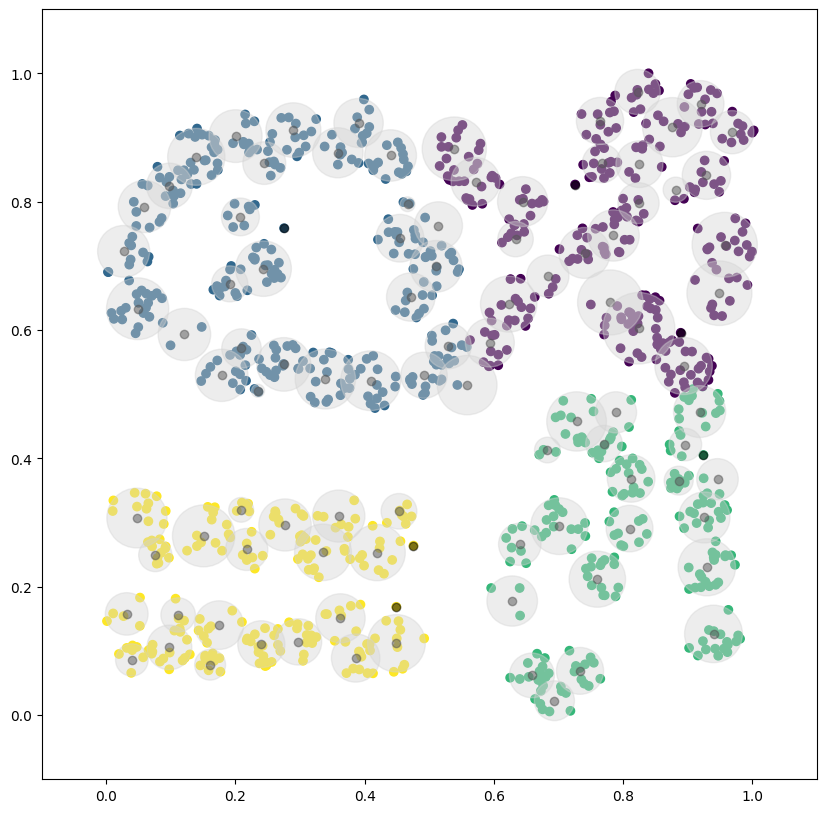

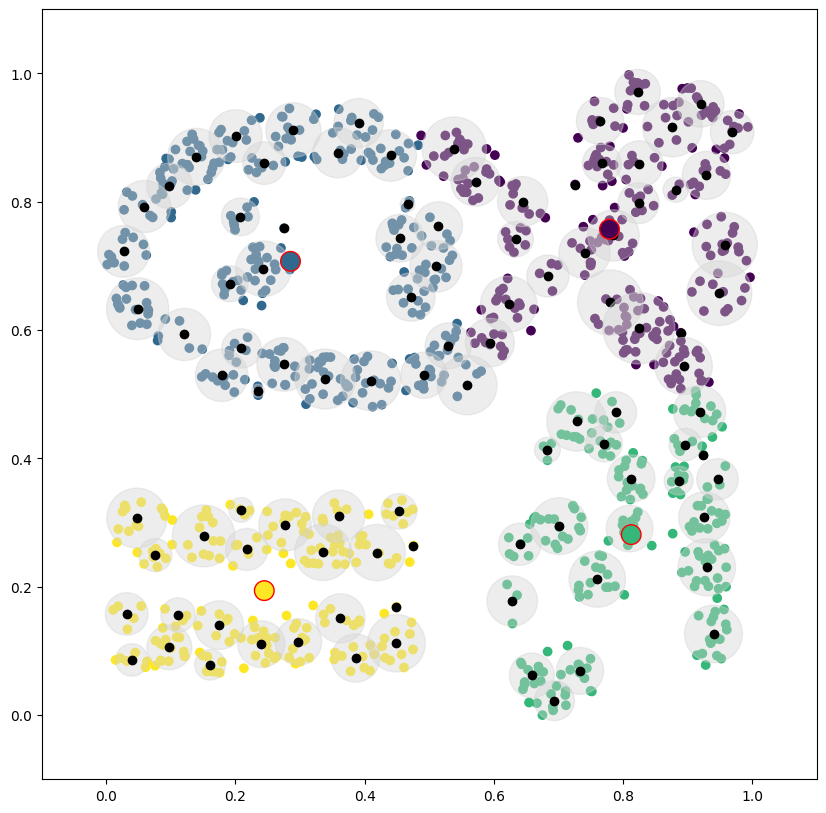

    0     1     2    3     4   5   6   7   8  
0    25     0    0     0   0   0   0   0   0  
1     0    36    0     0   0   0   0   0   0  
2     0    41    0     0   0   0   0   0   0  
3     0     0   59     0   0   0   0   0   0  
4     0     0   66     0   0   0   0   0   0  
5     0     0    0   100   0   0   0   0   0  
6    76   231    0     0   0   0   0   0   0  
7     0     0    0   108   0   0   0   0   0  
8   174     0   84     0   0   0   0   0   0  
Acc: 0.579 NMI: 0.6393862687526227 ARI: 0.4513267788520789 AMI: 0.6366493954759863 Pur.: 0.597 Prec.: 0.5013843718071707 Rec.: 0.6664662340085841 F1: 0.572257705574719 Comp.: 0.7560311371585501 Fowl.: 0.5780620676614967 Homo.: 0.5539237068125072 Clu.Num.: 4 True Clu.Num 9


In [49]:
from method.offlineHandler import GenCluStream
genclustream = GenCluStream(n_macro_clusters=9, max_micro_clusters=100, sigma=0.5, mu=0.5, seed=0, time_gap=10000, offline_datascale=1000, offline_algo="XMeans")
for x in X:
	dp = dict(enumerate(x))
	genclustream.learn_one(dp)
genclustream_labels_train = []
for x in X:
	dp = dict(enumerate(x))
	pred = genclustream.predict_one(dp)
	genclustream_labels_train.append(pred)
    
clustream_centers = genclustream.centers
plt.figure(figsize=(10, 10))
plt.scatter(X[:, 0], X[:, 1], c=genclustream_labels_train)
for id, mc in genclustream.micro_clusters.items():
    mccenter = dict_to_np(mc.center)
    mc_patch = ptc.Circle((float(mccenter[0]), float(mccenter[1])), mc.radius(2), alpha=0.4, color="lightgrey")
    plt.gca().add_patch(mc_patch)
    plt.scatter(float(mccenter[0]), float(mccenter[1]), c="black")
plt.scatter(clustream_centers[:, 0], clustream_centers[:,1], c=range(len(clustream_centers)), s= 200, edgecolors='red')

plt.ylim(-0.1, 1.1)
plt.xlim(-0.1, 1.1)
plt.show()
    
print(printMetrics(y, genclustream_labels_train))

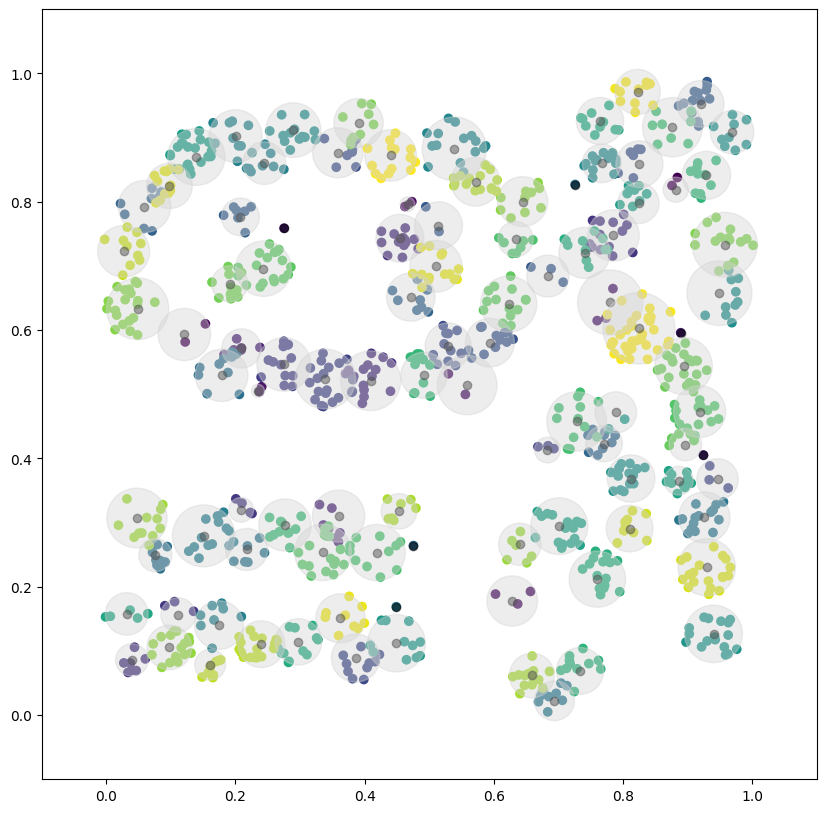

{'min_cluster_size': 50, 'rho': 1.2, 'beta': 0.2, 'seed': 0}


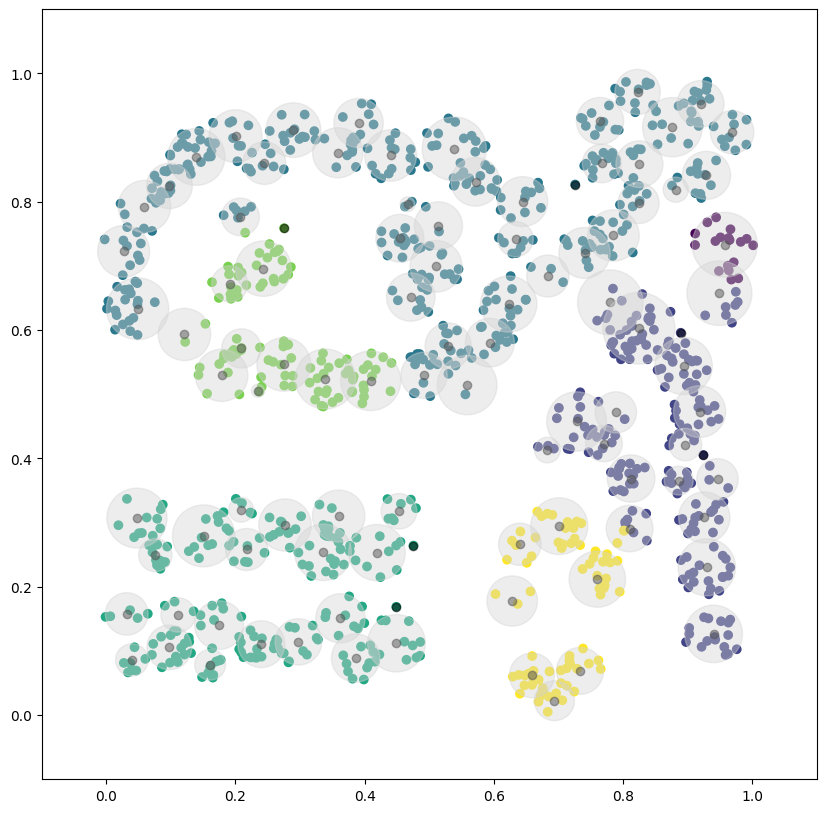

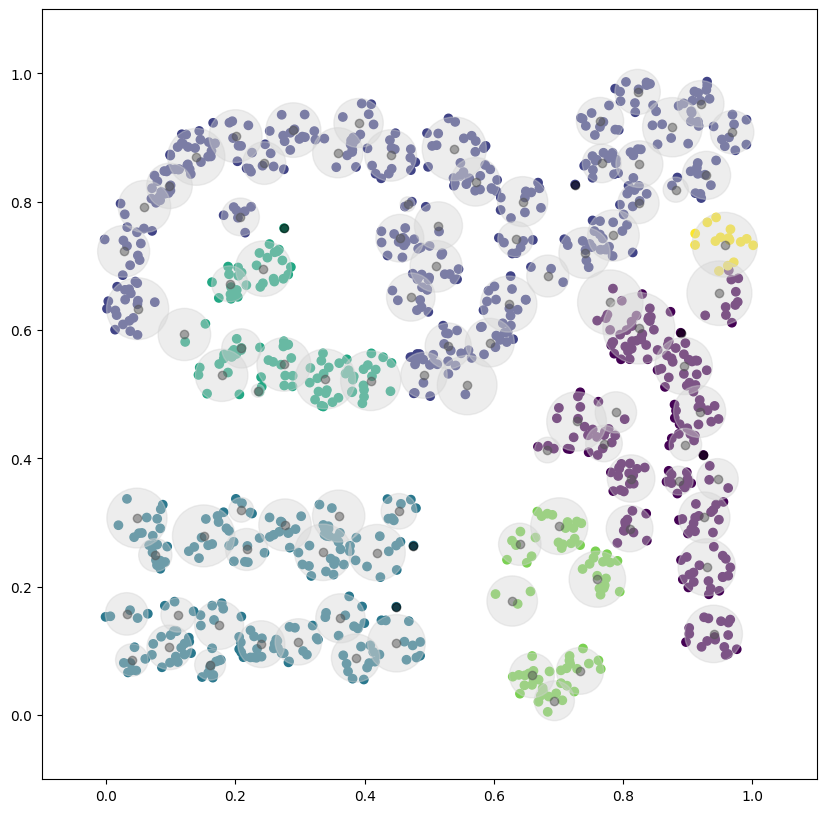

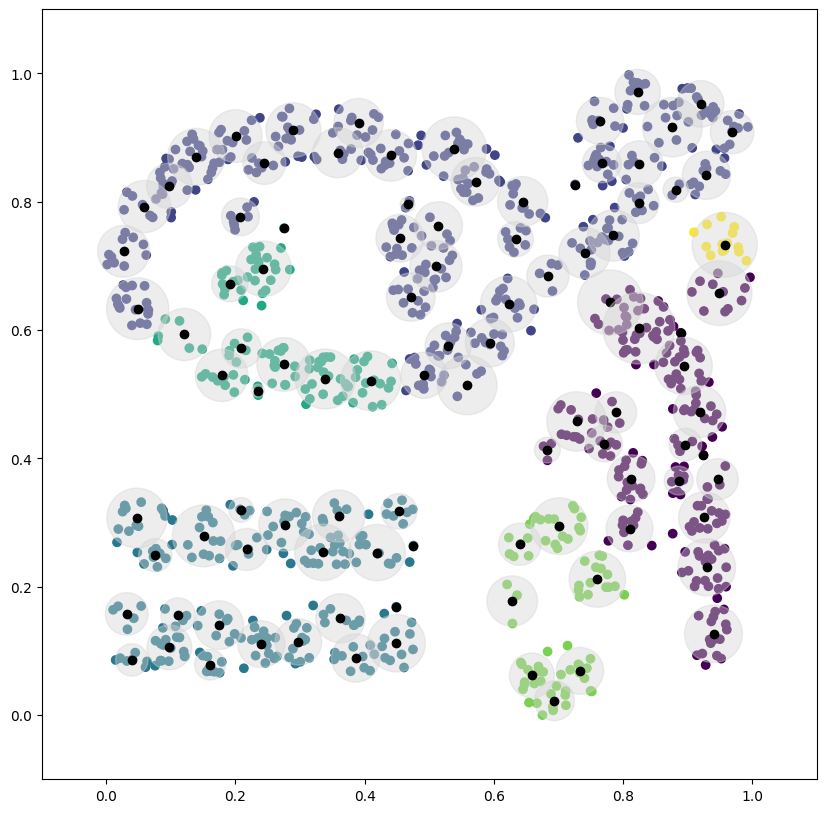

    0     1     2     3    4    5    6   7   8  
0    11     0     0    0    0   14   0   0   0  
1     0     7     0   29    0    0   0   0   0  
2     0    41     0    0    0    0   0   0   0  
3     0     0     0    0   59    0   0   0   0  
4    51     0     0    0   15    0   0   0   0  
5     0     0   100    0    0    0   0   0   0  
6     0   234     0   73    0    0   0   0   0  
7     0     0   108    0    0    0   0   0   0  
8   144   114     0    0    0    0   0   0   0  
Acc: 0.588 NMI: 0.6447886874762001 ARI: 0.4212430599906832 AMI: 0.6403213456749101 Pur.: 0.632 Prec.: 0.48012360632317774 Rec.: 0.6410873126127433 F1: 0.5490512932067799 Comp.: 0.7236131925744309 Fowl.: 0.5547982989336439 Homo.: 0.5814502509462867 Clu.Num.: 6 True Clu.Num 9


In [50]:
from method.offlineHandler import GenCluStream
genclustream = GenCluStream(n_macro_clusters=9, max_micro_clusters=100, seed=0, time_gap=10000, offline_datascale=1000, offline_algo="DBHD", offline_args={"min_cluster_size":50, "rho":1.2, "beta": 0.2})
for x in X:
	dp = dict(enumerate(x))
	genclustream.learn_one(dp)
genclustream_labels_train = []
for x in X:
	dp = dict(enumerate(x))
	pred = genclustream.predict_one(dp)
	genclustream_labels_train.append(pred)
    
plt.figure(figsize=(10, 10))
plt.scatter(X[:, 0], X[:, 1], c=genclustream_labels_train)
for id, mc in genclustream.micro_clusters.items():
    mccenter = dict_to_np(mc.center)
    mc_patch = ptc.Circle((float(mccenter[0]), float(mccenter[1])), mc.radius(2), alpha=0.4, color="lightgrey")
    plt.gca().add_patch(mc_patch)
    plt.scatter(float(mccenter[0]), float(mccenter[1]), c="black")
#plt.scatter(clustream_centers[:, 0], clustream_centers[:,1], c=range(len(clustream_centers)), s= 200, edgecolors='red')

plt.ylim(-0.1, 1.1)
plt.xlim(-0.1, 1.1)
plt.show()
    
print(printMetrics(y, genclustream_labels_train))

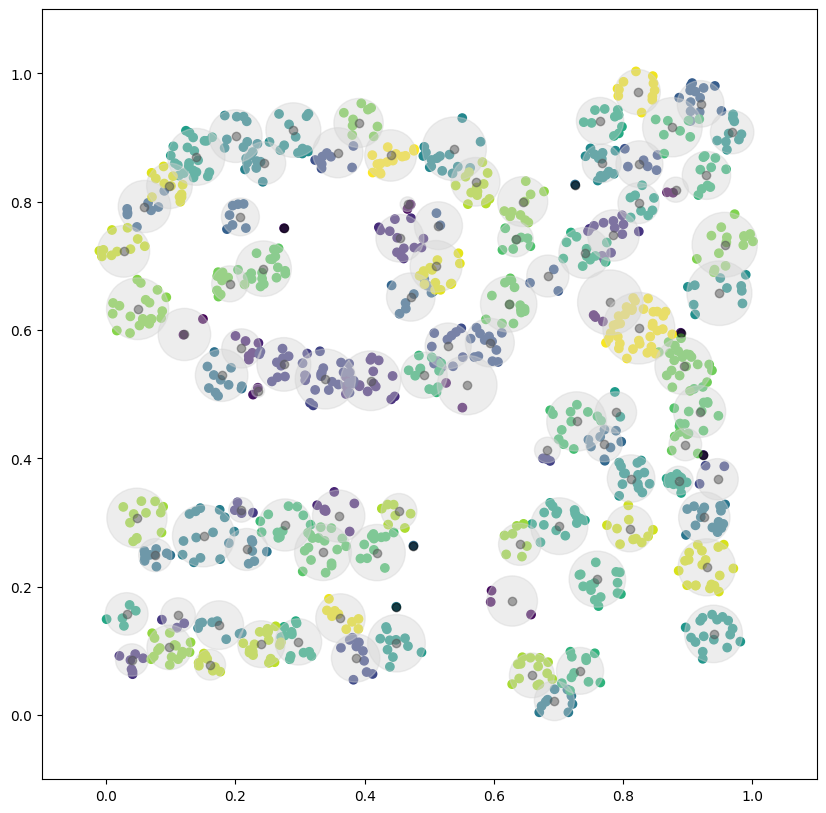

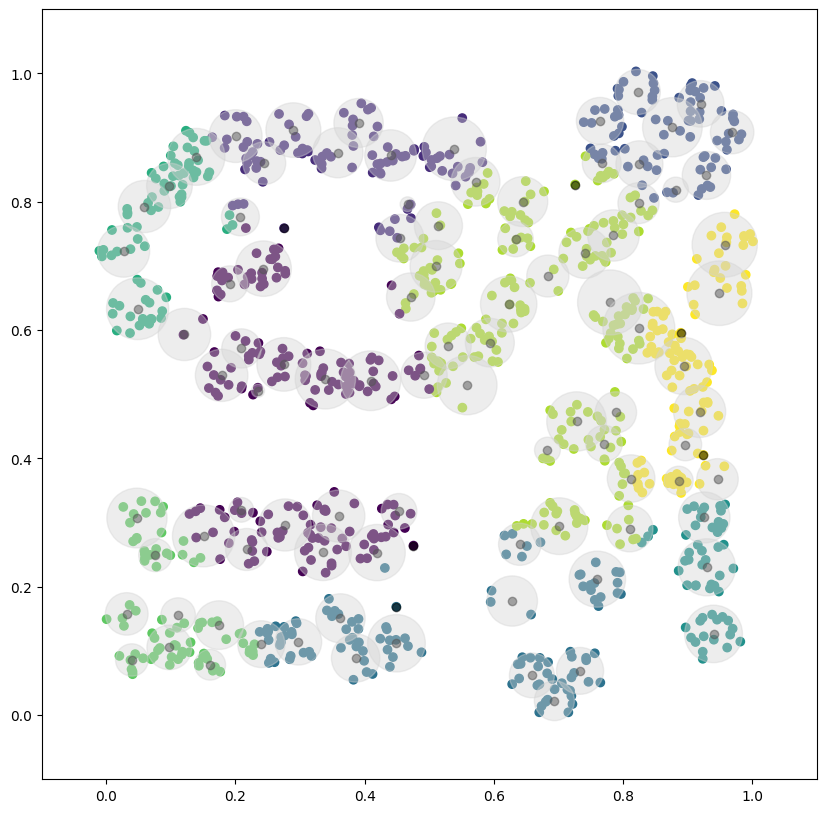

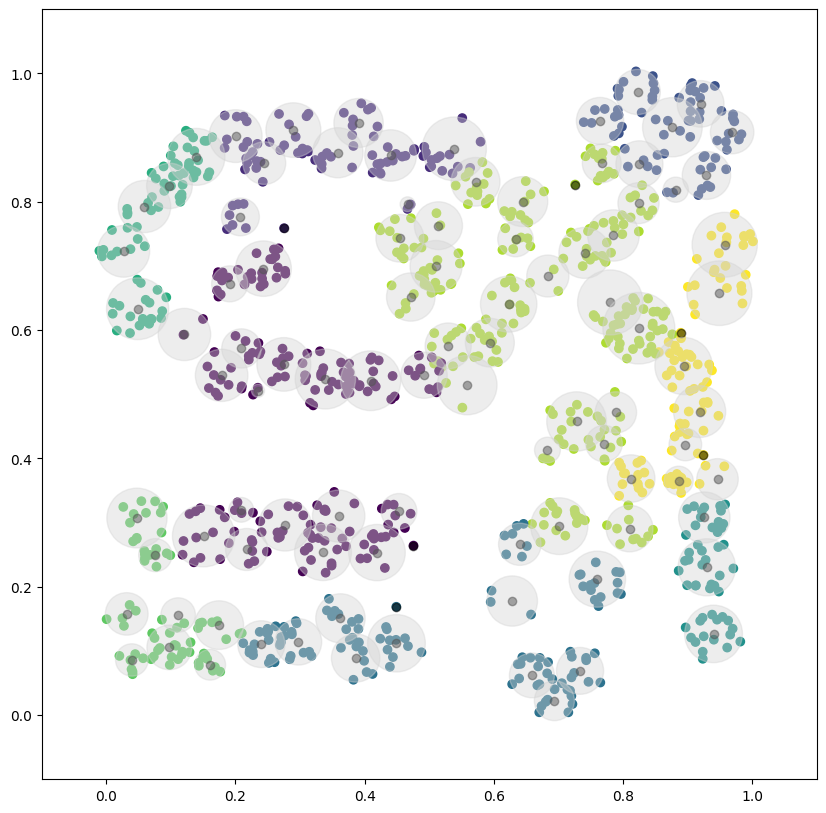

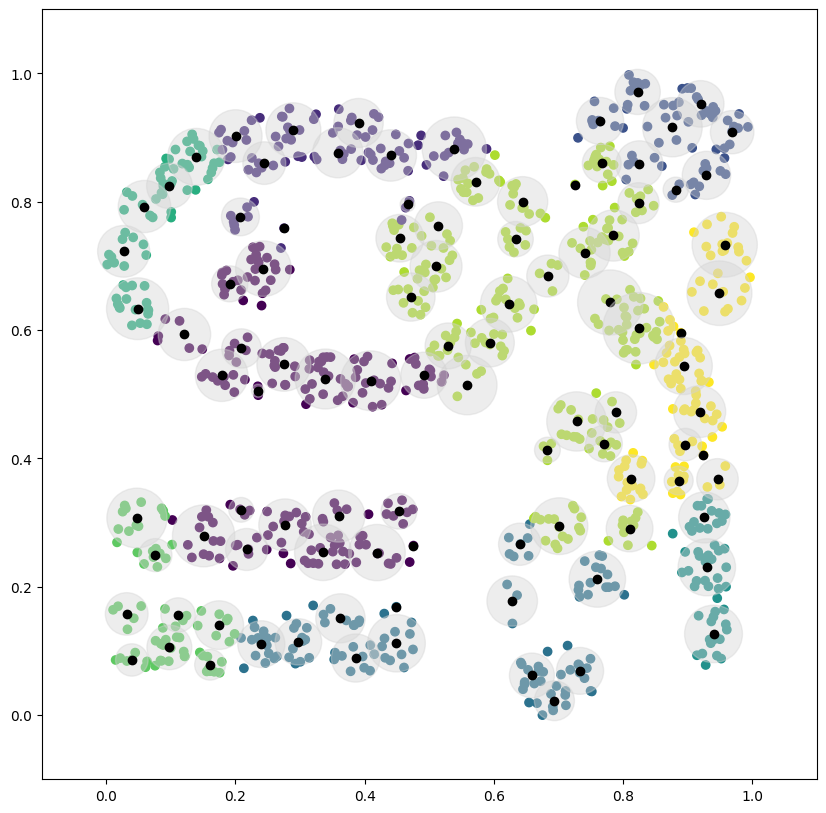

    0    1    2    3    4    5    6    7    8   
0    0    0    0    0    0    0    0    0   25  
1   27    9    0    0    0    0    0    0    0  
2    0    3    0    0    0    0    0   38    0  
3    0    0    0   43    0    0    0   16    0  
4    0    0    0   15    0    0    0   36   15  
5   78    0    0    0    0    0   22    0    0  
6   85   77    0    0    0   68    0   77    0  
7    0    0    0   60    0    0   48    0    0  
8    0    0   69    0   51    0    0   78   60  
Acc: 0.378 NMI: 0.5211233239323498 ARI: 0.22178338555107882 AMI: 0.5127452192933972 Pur.: 0.596 Prec.: 0.40988210432654876 Rec.: 0.30564598063405835 F1: 0.35017162947038355 Comp.: 0.49698357794984604 Fowl.: 0.35394747876095883 Homo.: 0.5477278470641092 Clu.Num.: 9 True Clu.Num 9


In [51]:
from method.offlineHandler import GenCluStream
genclustream = GenCluStream(n_macro_clusters=9, max_micro_clusters=100, seed=0, time_gap=10000, offline_datascale=1000, offline_algo="Spectral")
for x in X:
	dp = dict(enumerate(x))
	genclustream.learn_one(dp)
genclustream_labels_train = []
for x in X:
	dp = dict(enumerate(x))
	pred = genclustream.predict_one(dp)
	genclustream_labels_train.append(pred)
    
plt.figure(figsize=(10, 10))
plt.scatter(X[:, 0], X[:, 1], c=genclustream_labels_train)
for id, mc in genclustream.micro_clusters.items():
    mccenter = dict_to_np(mc.center)
    mc_patch = ptc.Circle((float(mccenter[0]), float(mccenter[1])), mc.radius(2), alpha=0.4, color="lightgrey")
    plt.gca().add_patch(mc_patch)
    plt.scatter(float(mccenter[0]), float(mccenter[1]), c="black")
#plt.scatter(clustream_centers[:, 0], clustream_centers[:,1], c=range(len(clustream_centers)), s= 200, edgecolors='red')

plt.ylim(-0.1, 1.1)
plt.xlim(-0.1, 1.1)
plt.show()
    
print(printMetrics(y, genclustream_labels_train))

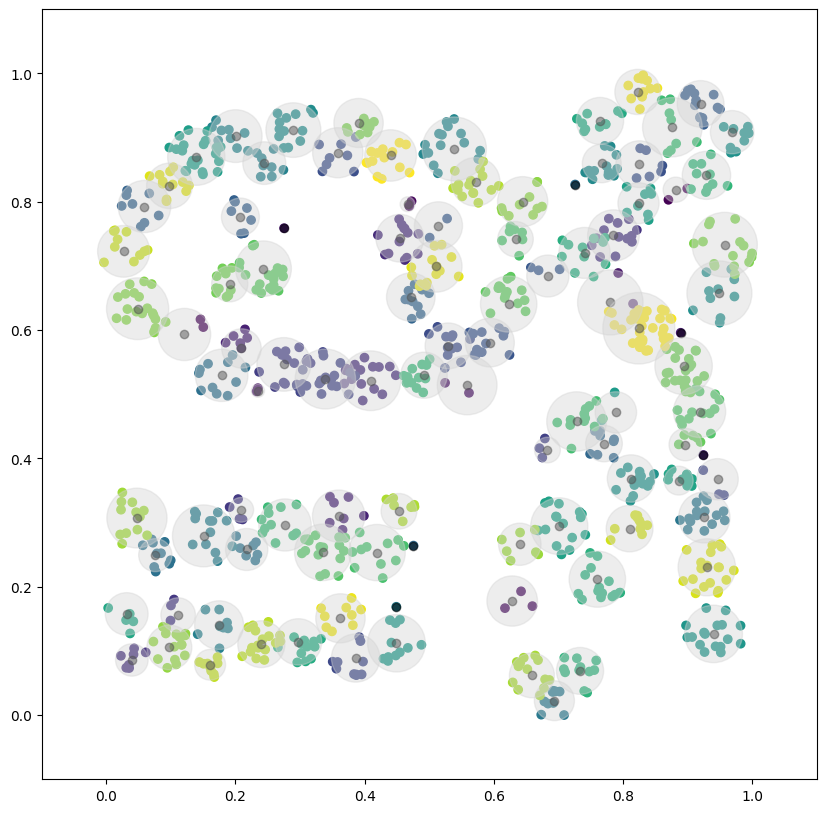

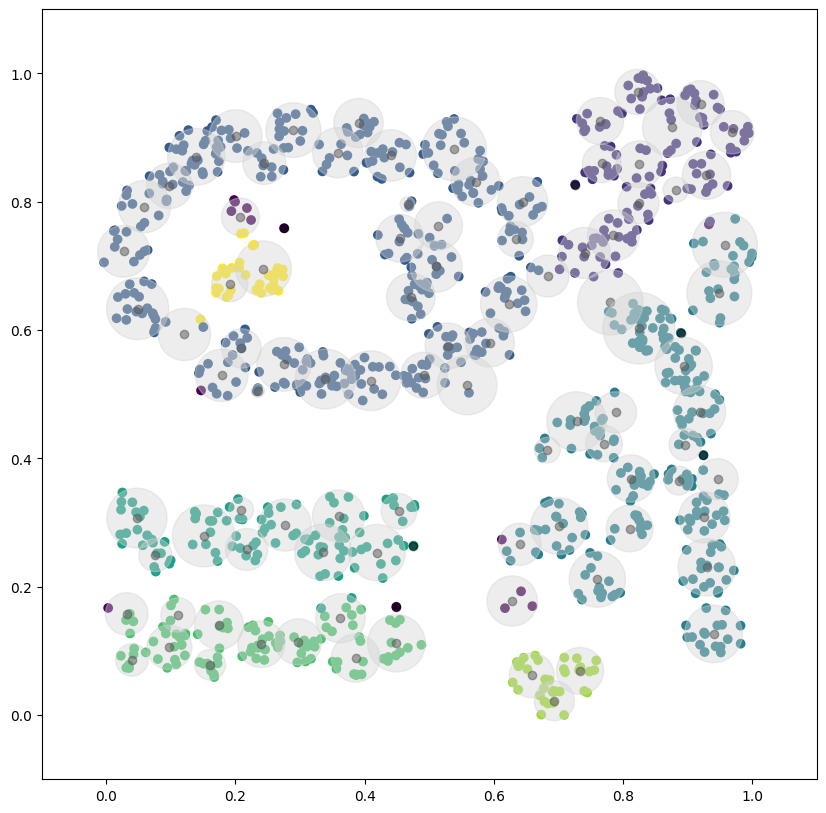

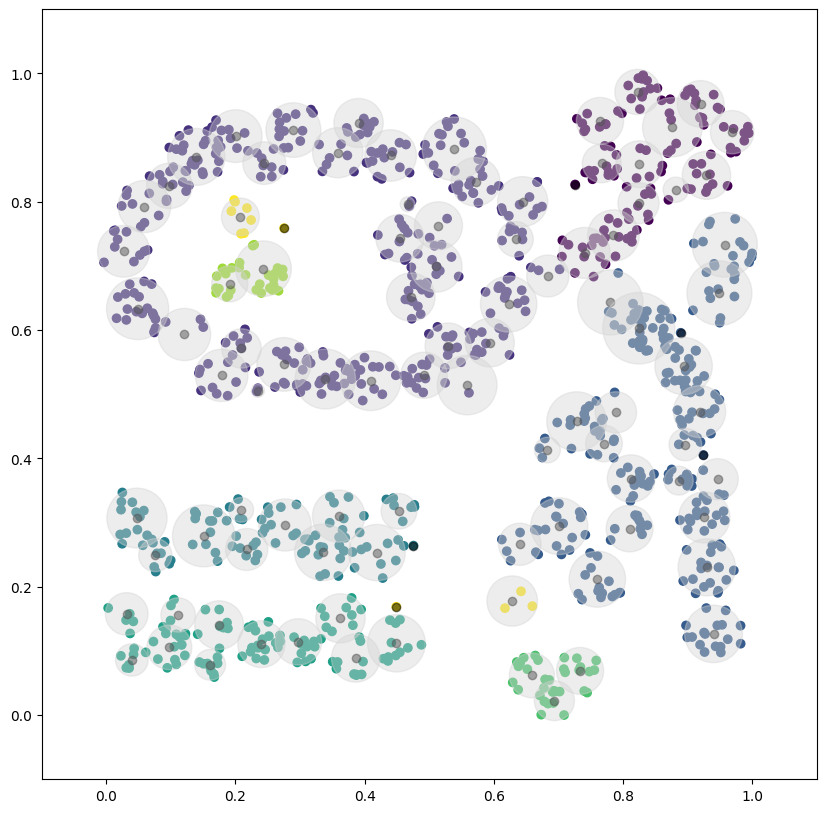

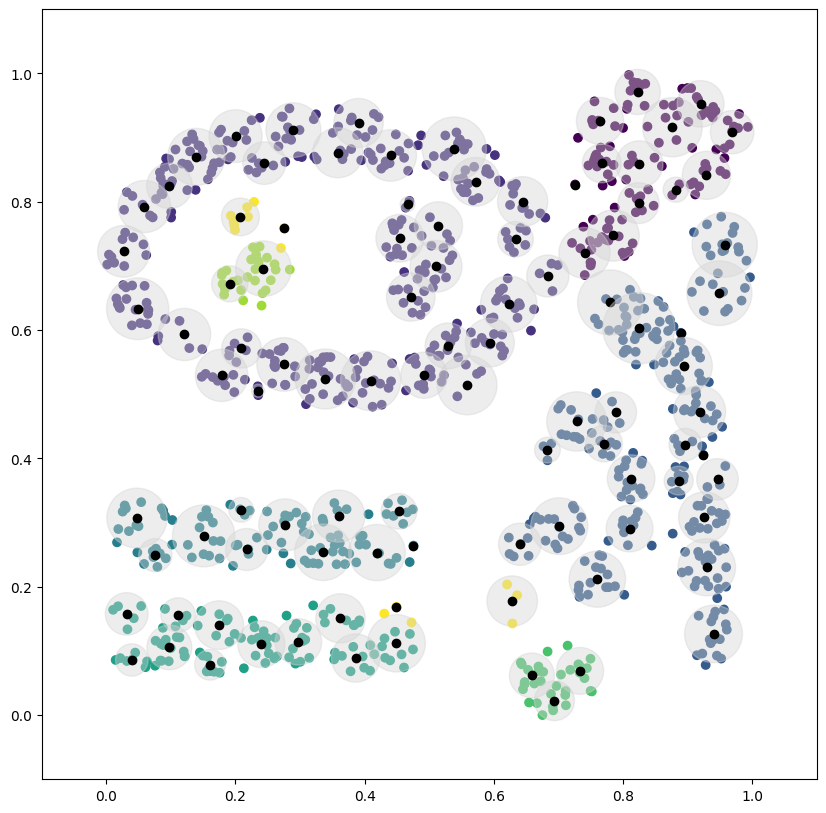

    0     1     2     3     4     5    6    7   8  
0     0     0    25     0     0    0    0   0   0  
1     0     0     0     0     0    0   27   9   0  
2     0    41     0     0     0    0    0   0   0  
3     0     0    23     0     0   33    0   3   0  
4     0     0    66     0     0    0    0   0   0  
5     0     0     0   100     0    0    0   0   0  
6     0   307     0     0     0    0    0   0   0  
7     0     0     0     0   105    0    0   3   0  
8   114     0   144     0     0    0    0   0   0  
Acc: 0.752 NMI: 0.8073064971103022 ARI: 0.6923168811406751 AMI: 0.804025438118448 Pur.: 0.839 Prec.: 0.7053948242731175 Rec.: 0.814416637292915 F1: 0.7559954576949727 Comp.: 0.8469780062879446 Fowl.: 0.7579480725935908 Homo.: 0.7711850460175733 Clu.Num.: 8 True Clu.Num 9


In [52]:
from method.offlineHandler import GenCluStream
genclustream = GenCluStream(n_macro_clusters=9, max_micro_clusters=100, seed=0, time_gap=10000, offline_datascale=1000, offline_algo="DBSCAN", offline_args={"eps":0.05, "min_samples":10})
for x in X:
	dp = dict(enumerate(x))
	genclustream.learn_one(dp)
genclustream_labels_train = []
for x in X:
	dp = dict(enumerate(x))
	pred = genclustream.predict_one(dp)
	genclustream_labels_train.append(pred)
    
plt.figure(figsize=(10, 10))
plt.scatter(X[:, 0], X[:, 1], c=genclustream_labels_train)
for id, mc in genclustream.micro_clusters.items():
    mccenter = dict_to_np(mc.center)
    mc_patch = ptc.Circle((float(mccenter[0]), float(mccenter[1])), mc.radius(2), alpha=0.4, color="lightgrey")
    plt.gca().add_patch(mc_patch)
    plt.scatter(float(mccenter[0]), float(mccenter[1]), c="black")
#plt.scatter(clustream_centers[:, 0], clustream_centers[:,1], c=range(len(clustream_centers)), s= 200, edgecolors='red')

plt.ylim(-0.1, 1.1)
plt.xlim(-0.1, 1.1)
plt.show()
    
print(printMetrics(y, genclustream_labels_train))

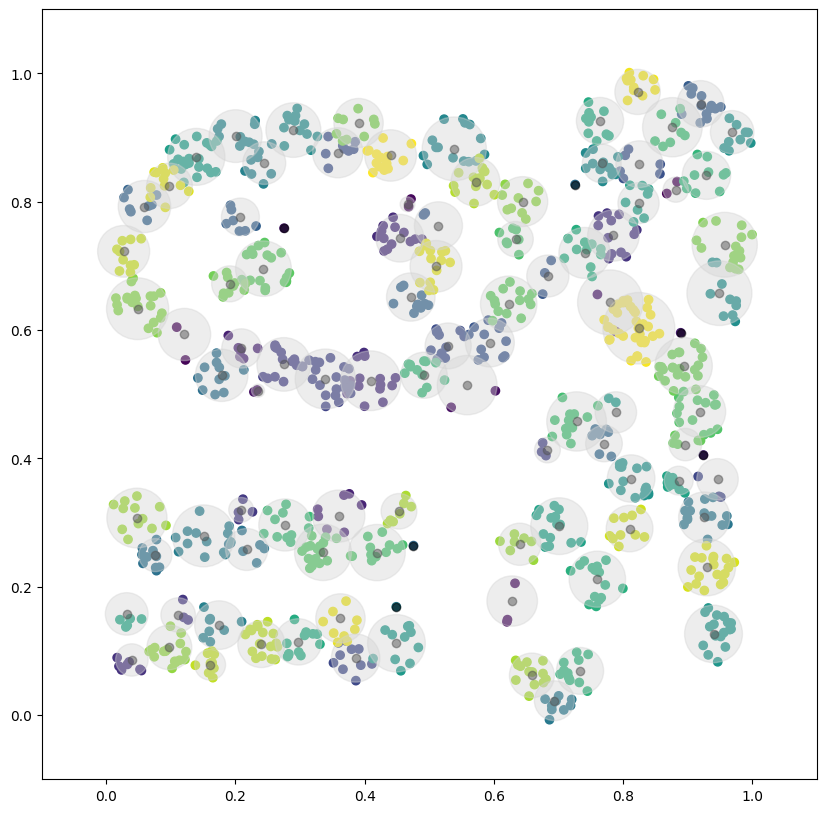

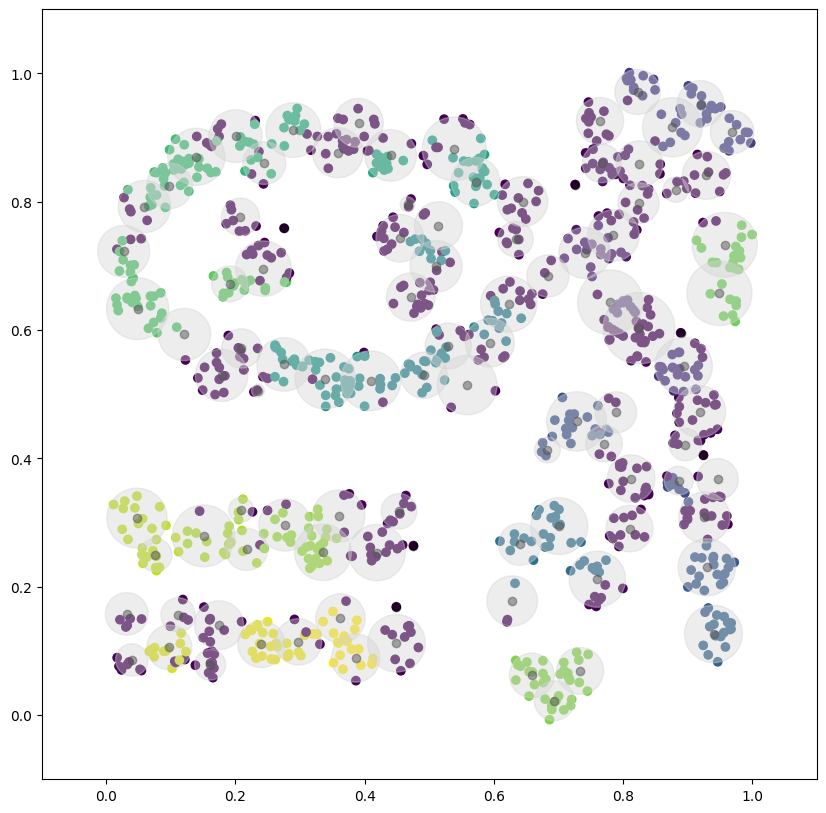

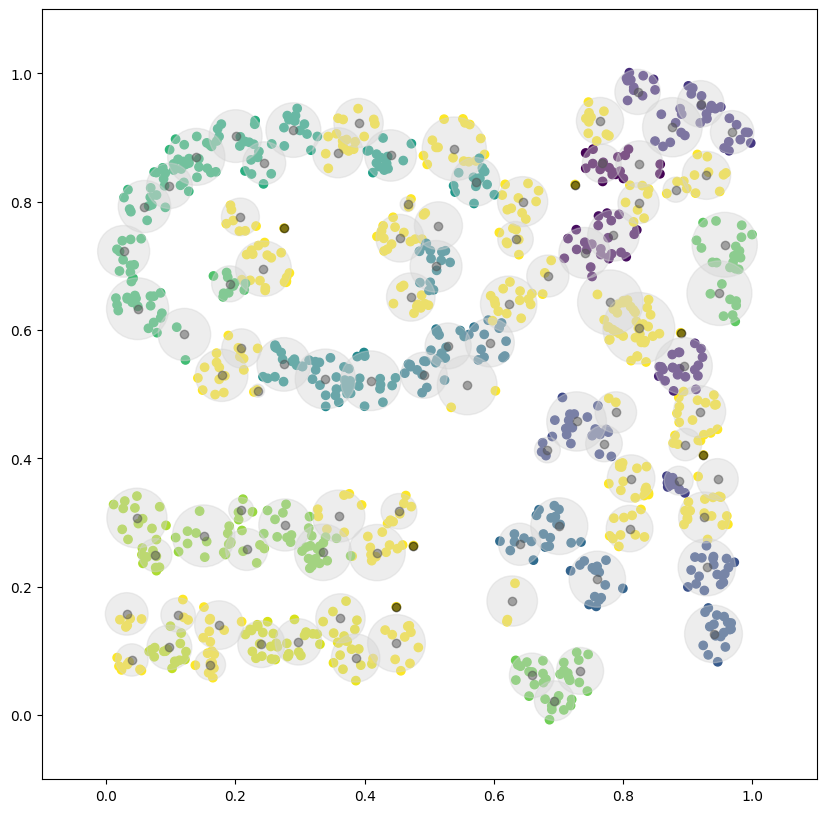

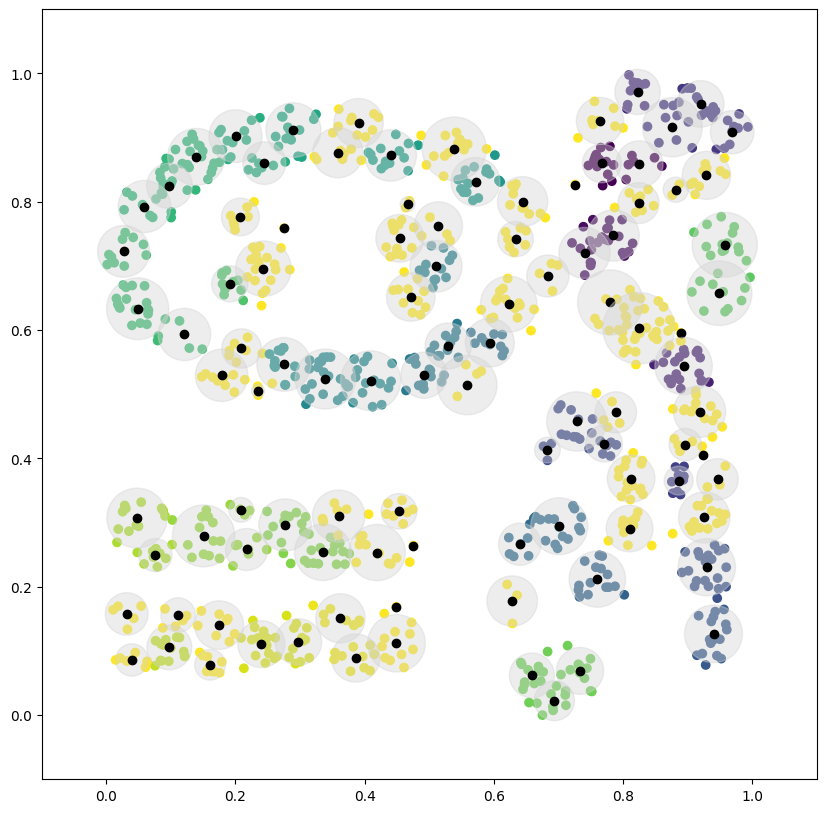

     0    1    2   3    4    5    6    7    8    9    10   11   12   13   14   15   16   17   18   19   20   21   22   23   24   25   26   27   28   29   30   31   32   
 0    0    0   0    0    0    0    0    0    0    0    0    0    0    0    0    0    0    0    0    0    0    0    0    0   25    0    0    0    0    0    0    0     0  
 1    0    0   0    0    0    0    0    0    0    0    0    0    0    0    0    0    0    0    0    0    0    0    0   10    0    0    0    0    0    0    0    0    26  
 2    0    0   0    0    0    0    0    0    0    0    0    0    0    0   12    0    0    0    0    0    0    0    0    0    0    0    0    0    0    0    0    0    29  
 3    0    0   0    0    0    0    0    0    0    0    0   23    0    0    0    0    0    0    0    0    0    0    0    0    0   33    0    0    0    0    0    0     3  
 4    0    0   0    0    0    0    0   21    0    0   15    0    0    0    0    0    0    0    0    0    0    0    0    0    0    0    0    0    0    

In [53]:
from method.offlineHandler import GenCluStream
genclustream = GenCluStream(n_macro_clusters=9, max_micro_clusters=100, seed=0, time_gap=10000, offline_datascale=1000, offline_algo="OPTICS", offline_args={"min_samples":10})
for x in X:
	dp = dict(enumerate(x))
	genclustream.learn_one(dp)
genclustream_labels_train = []
for x in X:
	dp = dict(enumerate(x))
	pred = genclustream.predict_one(dp)
	genclustream_labels_train.append(pred)
    
plt.figure(figsize=(10, 10))
plt.scatter(X[:, 0], X[:, 1], c=genclustream_labels_train)
for id, mc in genclustream.micro_clusters.items():
    mccenter = dict_to_np(mc.center)
    mc_patch = ptc.Circle((float(mccenter[0]), float(mccenter[1])), mc.radius(2), alpha=0.4, color="lightgrey")
    plt.gca().add_patch(mc_patch)
    plt.scatter(float(mccenter[0]), float(mccenter[1]), c="black")
#plt.scatter(clustream_centers[:, 0], clustream_centers[:,1], c=range(len(clustream_centers)), s= 200, edgecolors='red')

plt.ylim(-0.1, 1.1)
plt.xlim(-0.1, 1.1)
plt.show()
    
print(printMetrics(y, genclustream_labels_train))

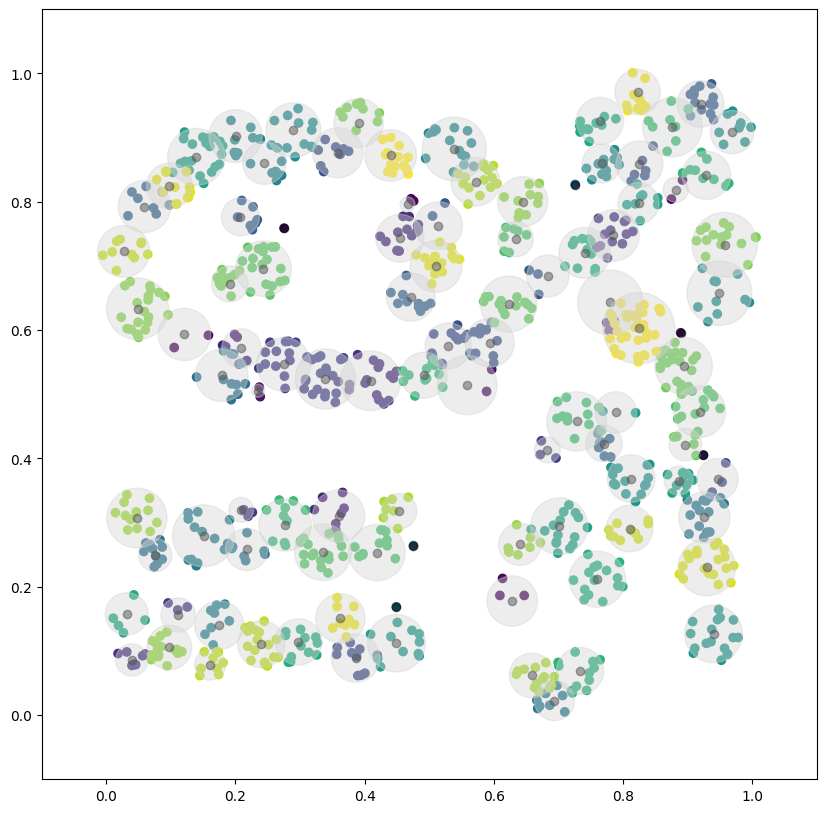

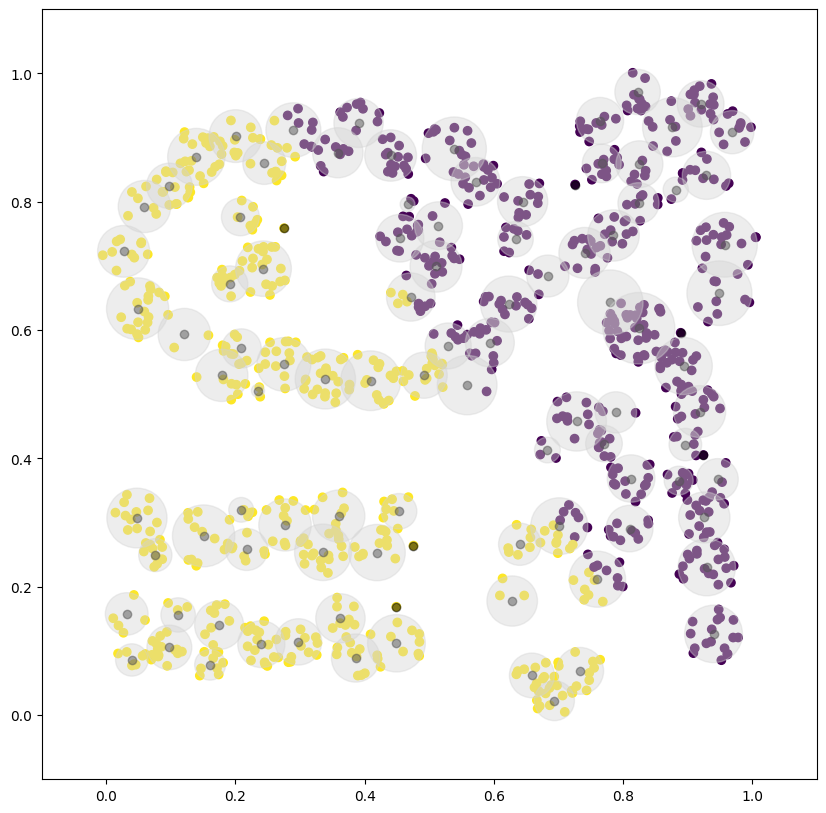

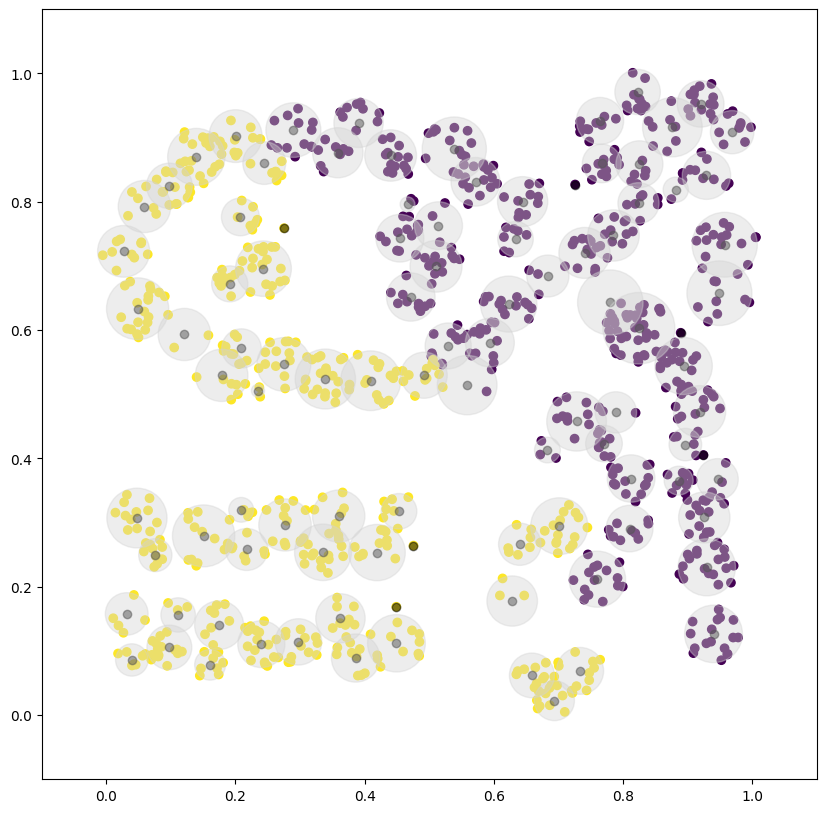

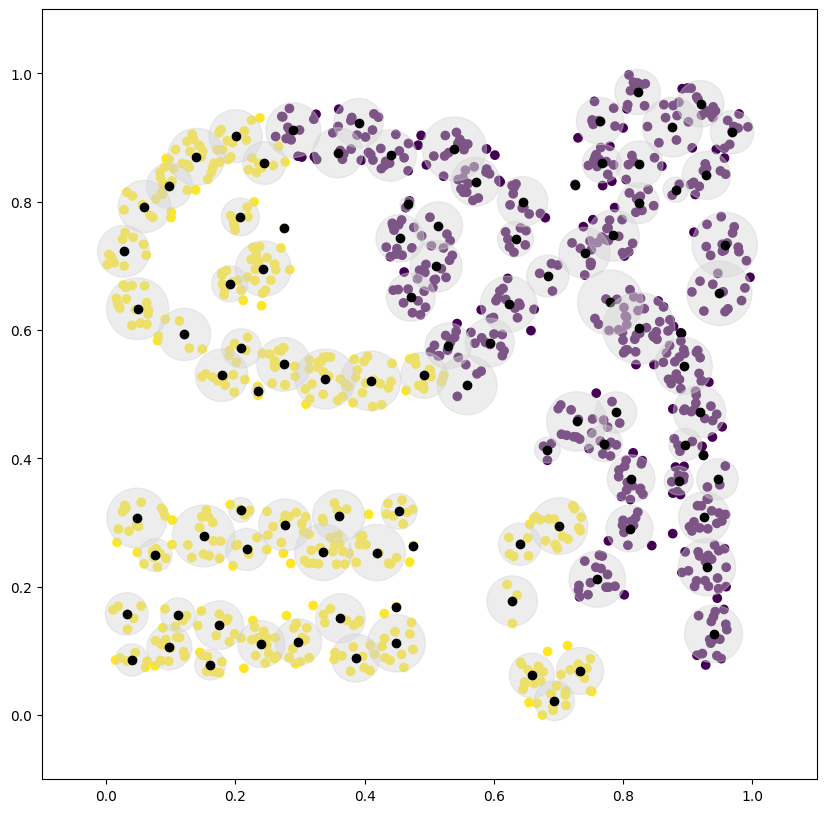

    0     1     2   3   4   5   6   7   8  
0    25     0   0   0   0   0   0   0   0  
1     0    36   0   0   0   0   0   0   0  
2    41     0   0   0   0   0   0   0   0  
3     0    59   0   0   0   0   0   0   0  
4    66     0   0   0   0   0   0   0   0  
5     0   100   0   0   0   0   0   0   0  
6   135   172   0   0   0   0   0   0   0  
7     0   108   0   0   0   0   0   0   0  
8   258     0   0   0   0   0   0   0   0  
Acc: 0.43 NMI: 0.3754813521759229 ARI: 0.19950849914868923 AMI: 0.37350750498461616 Pur.: 0.43 Prec.: 0.2928055972013993 Rec.: 0.7592734661718054 F1: 0.4226289229419793 Comp.: 0.6956754876514633 Fowl.: 0.4715077101189459 Homo.: 0.2571325757088406 Clu.Num.: 2 True Clu.Num 9


In [54]:
from method.offlineHandler import GenCluStream
genclustream = GenCluStream(n_macro_clusters=9, max_micro_clusters=100, seed=0, time_gap=10000, offline_datascale=1000, offline_algo="MeanShift")
for x in X:
	dp = dict(enumerate(x))
	genclustream.learn_one(dp)
genclustream_labels_train = []
for x in X:
	dp = dict(enumerate(x))
	pred = genclustream.predict_one(dp)
	genclustream_labels_train.append(pred)
    
plt.figure(figsize=(10, 10))
plt.scatter(X[:, 0], X[:, 1], c=genclustream_labels_train)
for id, mc in genclustream.micro_clusters.items():
    mccenter = dict_to_np(mc.center)
    mc_patch = ptc.Circle((float(mccenter[0]), float(mccenter[1])), mc.radius(2), alpha=0.4, color="lightgrey")
    plt.gca().add_patch(mc_patch)
    plt.scatter(float(mccenter[0]), float(mccenter[1]), c="black")
#plt.scatter(clustream_centers[:, 0], clustream_centers[:,1], c=range(len(clustream_centers)), s= 200, edgecolors='red')

plt.ylim(-0.1, 1.1)
plt.xlim(-0.1, 1.1)
plt.show()
    
print(printMetrics(y, genclustream_labels_train))

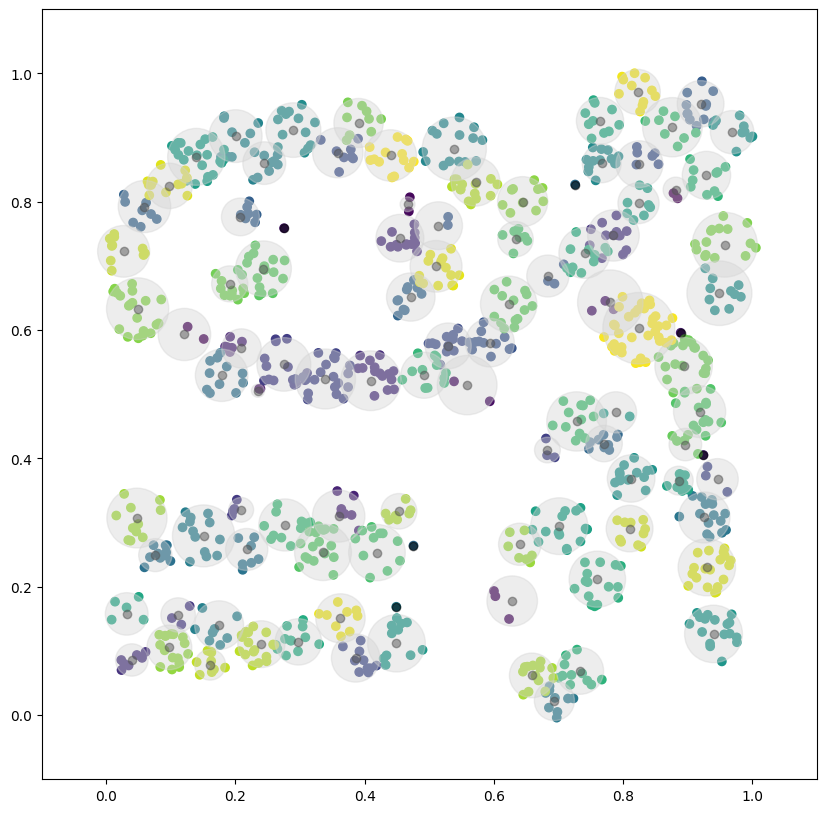

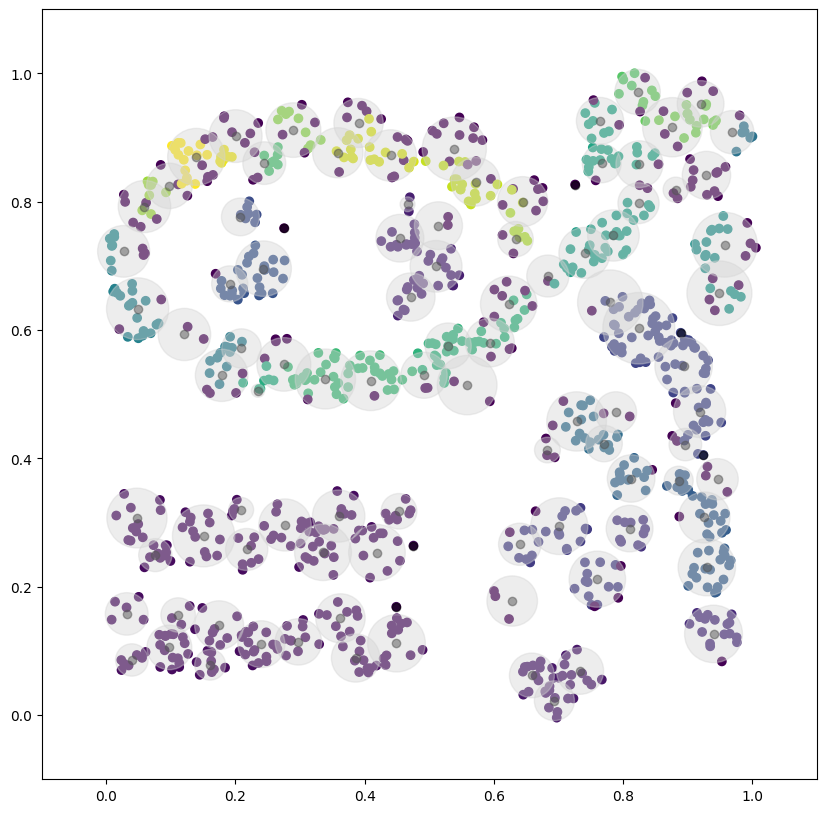

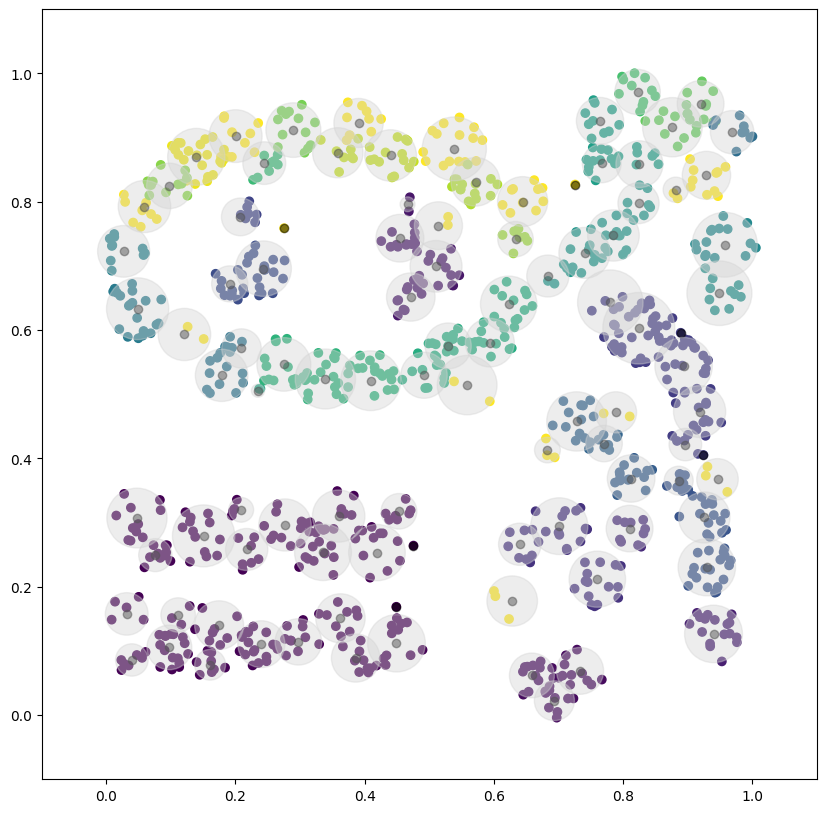

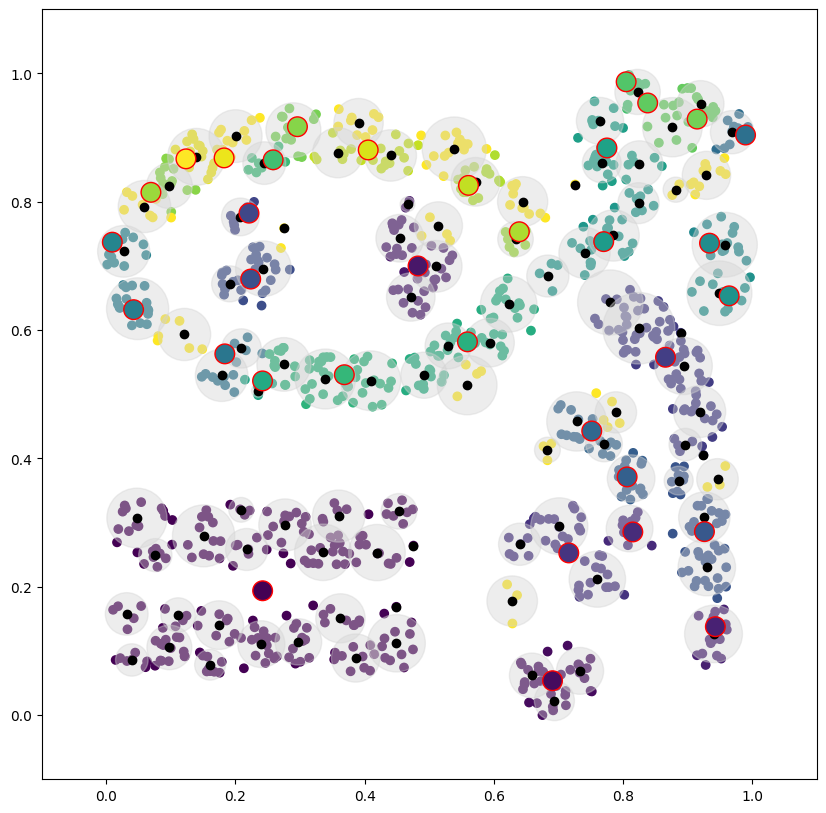

     0     1    2    3    4    5    6    7   8    9    10   11   12   13   14   15   16   17   18   19   20   21   22   23   24   26   27   28   29   30   31   33   34  
 0     0    0    0    0    0    0    0   0    0    0    0    0    0    0    0    0   14   11    0    0    0    0    0    0    0    0    0    0    0    0    0    0    0  
 1     0    0    0    0    0    0    0   7   27    0    0    0    0    0    0    0    0    0    0    0    0    0    0    0    0    0    0    0    0    0    0    0    2  
 2     0    0   37    0    0    0    0   0    0    0    0    0    0    0    0    0    0    0    0    0    0    0    0    0    0    0    0    0    0    0    0    0    4  
 3     0   33    0    0    0   23    0   0    0    0    0    0    0    0    0    0    0    0    0    0    0    0    0    0    0    0    0    0    0    0    0    0    3  
 4     0    0    0    0   10   15    0   0    0    0   15   18    0    0    0    0    0    0    0    0    0    0    0    0    0    0    0    0    0   

In [55]:
from method.offlineHandler import GenCluStream
genclustream = GenCluStream(n_macro_clusters=9, max_micro_clusters=100, seed=0, time_gap=10000, offline_datascale=1000, offline_algo="HDBSCAN")
for x in X:
	dp = dict(enumerate(x))
	genclustream.learn_one(dp)
genclustream_labels_train = []
for x in X:
	dp = dict(enumerate(x))
	pred = genclustream.predict_one(dp)
	genclustream_labels_train.append(pred)
    
clustream_centers = genclustream.centers
plt.figure(figsize=(10, 10))
plt.scatter(X[:, 0], X[:, 1], c=genclustream_labels_train)
for id, mc in genclustream.micro_clusters.items():
    mccenter = dict_to_np(mc.center)
    mc_patch = ptc.Circle((float(mccenter[0]), float(mccenter[1])), mc.radius(2), alpha=0.4, color="lightgrey")
    plt.gca().add_patch(mc_patch)
    plt.scatter(float(mccenter[0]), float(mccenter[1]), c="black")
plt.scatter(clustream_centers[:, 0], clustream_centers[:,1], c=range(len(clustream_centers)), s= 200, edgecolors='red')

plt.ylim(-0.1, 1.1)
plt.xlim(-0.1, 1.1)
plt.show()
    
print(printMetrics(y, genclustream_labels_train))

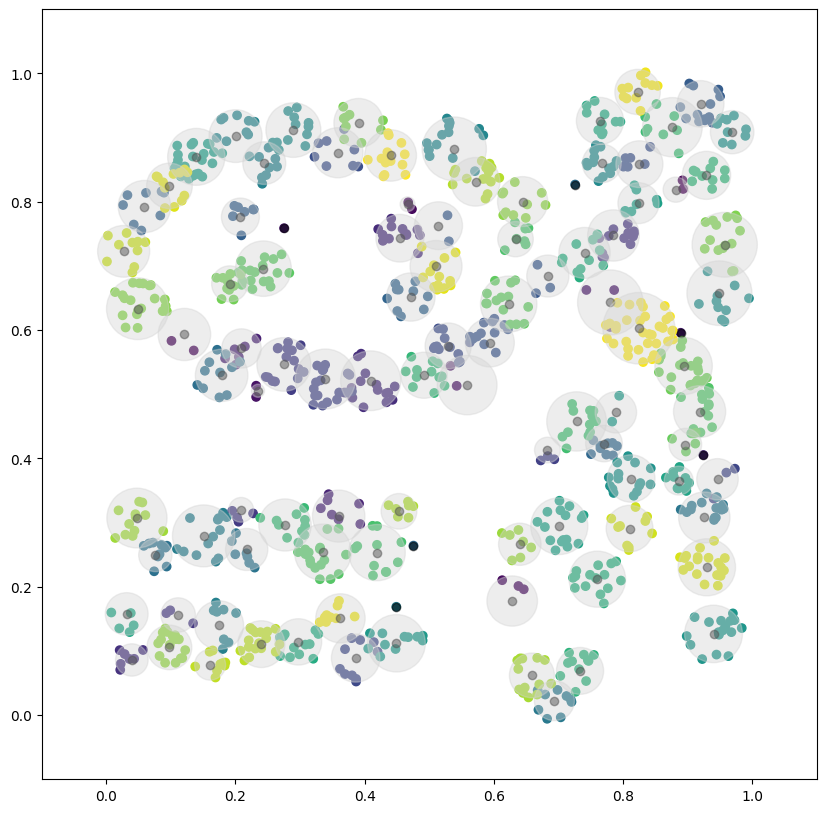

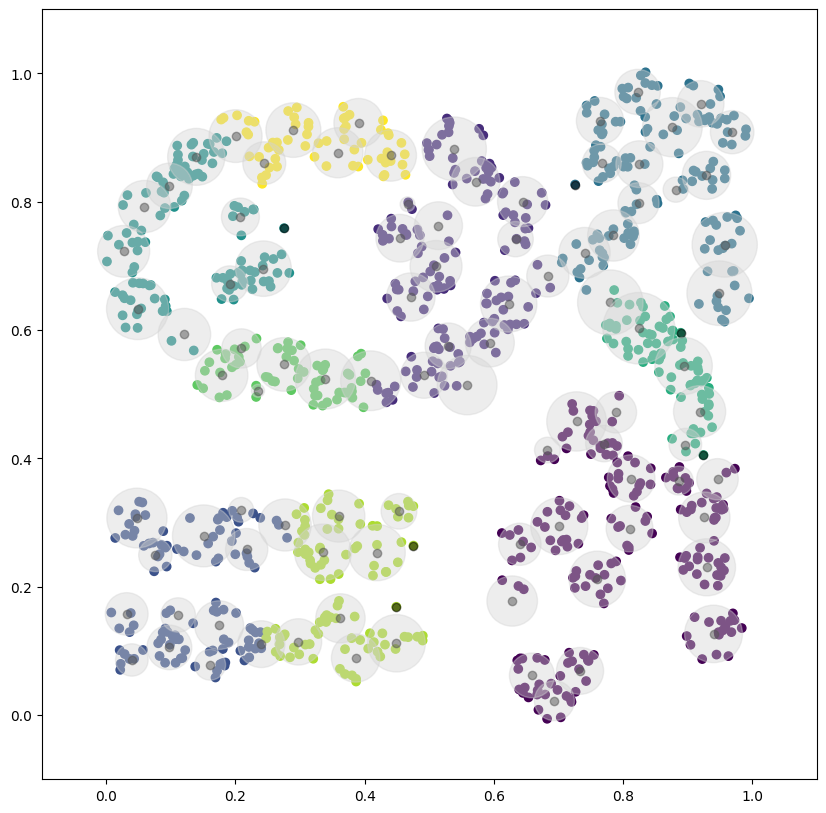

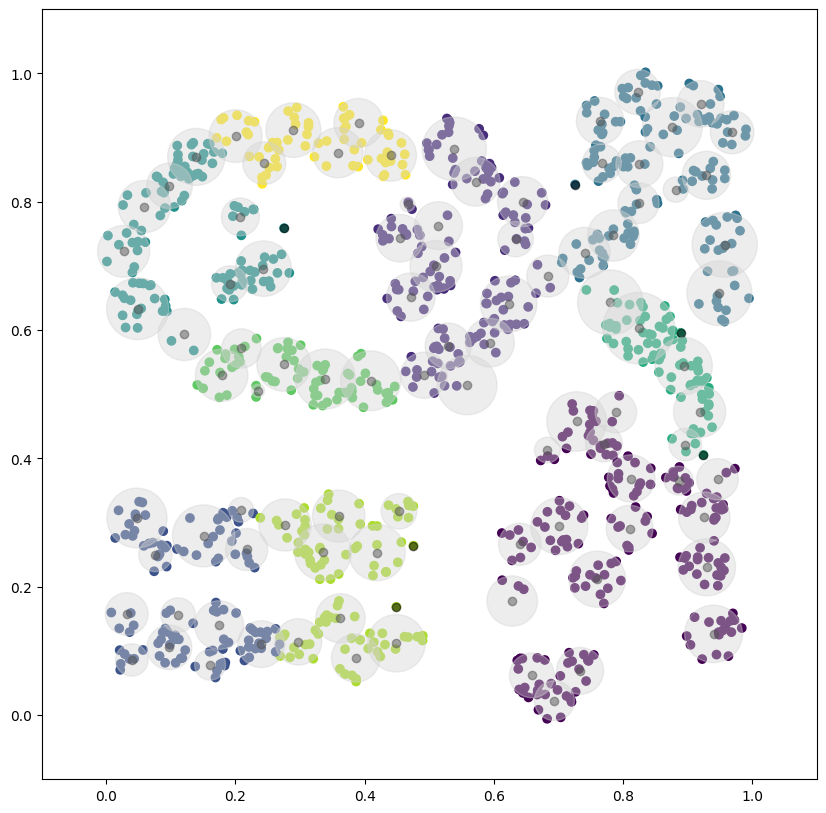

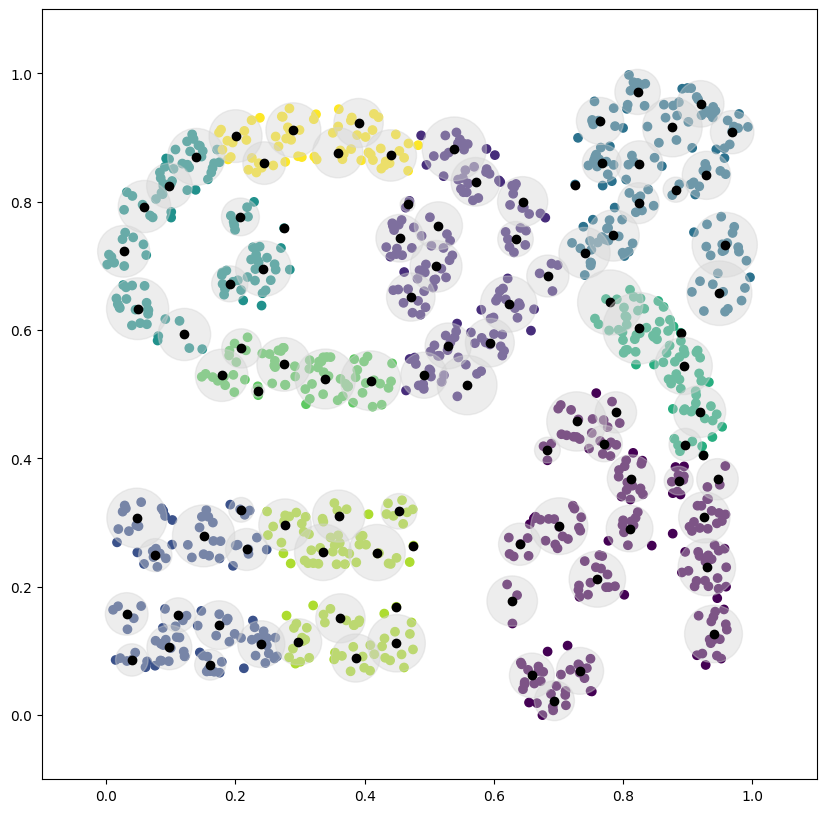

    0    1     2    3     4    5    6    7    8   
0    0     0    0    25    0    0    0    0    0  
1    0     0    0     0   36    0    0    0    0  
2    0    41    0     0    0    0    0    0    0  
3   59     0    0     0    0    0    0    0    0  
4   66     0    0     0    0    0    0    0    0  
5    0     0   46     0    0    0    0   54    0  
6    0   103    0     0   74    0   67    0   63  
7    0     0   65     0    0    0    0   43    0  
8   64     0    0   114    0   80    0    0    0  
Acc: 0.443 NMI: 0.6490453681830632 ARI: 0.3404396762526639 AMI: 0.6430647899368115 Pur.: 0.686 Prec.: 0.563555958725479 Rec.: 0.36067511248419 F1: 0.43984803180964777 Comp.: 0.6085711429739356 Fowl.: 0.4508443287925974 Homo.: 0.6952867885839009 Clu.Num.: 9 True Clu.Num 9


In [56]:
from method.offlineHandler import GenCluStream
genclustream = GenCluStream(n_macro_clusters=9, max_micro_clusters=100, seed=0, time_gap=10000, offline_datascale=1000, offline_algo="Agglomerative")
for x in X:
	dp = dict(enumerate(x))
	genclustream.learn_one(dp)
genclustream_labels_train = []
for x in X:
	dp = dict(enumerate(x))
	pred = genclustream.predict_one(dp)
	genclustream_labels_train.append(pred)
    
plt.figure(figsize=(10, 10))
plt.scatter(X[:, 0], X[:, 1], c=genclustream_labels_train)
for id, mc in genclustream.micro_clusters.items():
    mccenter = dict_to_np(mc.center)
    mc_patch = ptc.Circle((float(mccenter[0]), float(mccenter[1])), mc.radius(2), alpha=0.4, color="lightgrey")
    plt.gca().add_patch(mc_patch)
    plt.scatter(float(mccenter[0]), float(mccenter[1]), c="black")
#plt.scatter(clustream_centers[:, 0], clustream_centers[:,1], c=range(len(clustream_centers)), s= 200, edgecolors='red')

plt.ylim(-0.1, 1.1)
plt.xlim(-0.1, 1.1)
plt.show()
    
print(printMetrics(y, genclustream_labels_train))